In [4]:
%cd /content/echidna

/content/echidna


In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
import numpy as np

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
import scanpy as sc
import pandas as pd
import sys
sys.path.append("../")

In [10]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import rcParams

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 10})
rcParams.update({'figure.dpi': 300})
rcParams.update({'savefig.dpi': 300})

import warnings
warnings.filterwarnings('ignore')

In [11]:
import echidna as ec
import matplotlib.pyplot as plt
import torch
from scipy.stats import linregress
import seaborn as sns
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list, fcluster
from matplotlib.colors import ListedColormap
ec.pl.activate_plot_settings()

# Helper func

In [12]:
def get_binned_DNA(adata, DNA, map, eta):
  barcodes = list(adata.obs_names)
  for i in range(len(barcodes)):
    barcodes[i] = barcodes[i].split("_")[0]
  barcodes_overlap = set(barcodes).intersection(set(DNA.columns))

  DNA = DNA[barcodes]
  DNA = DNA / np.array(DNA).mean(axis=0) * 2 # THIS STEP IS DESCRIBED IN THE PUBLISHED PAPER THIS DATA CAME FROM


  eta_df = pd.DataFrame(eta.cpu().detach().numpy())
  eta_df.columns = adata.var_names

  DNA_clus = pd.DataFrame()
  for cluster in eta_df.index:
    DNA_cluster = []
    obs = adata.obs
    for i in range(10):
        inds = obs[obs["leiden"]==str(i)].index
        inds = [i.split("_")[0] for i in inds]
        DNA_cluster.append(list(DNA[inds].mean(axis=1)))

    DNA_cluster = pd.DataFrame(DNA_cluster)

    gene_names = []
    W1 = []
    for i in range(DNA_cluster.shape[1]):
        genes = str.split(map.iloc[i]["genes"],",")
        gene_names+=genes
        W1+=[DNA_cluster.loc[cluster][i] for j in range(len(genes))]

    DNA_clus[cluster] =  W1
  DNA_clus.index = gene_names
  return DNA_clus, DNA_cluster

In [13]:
# helper function for binning
def binning_eta(df):
    binned = []
    discard_bins = []
    for id, row in map.iterrows():
        genes = str.split(row['genes'],",")
        overlap = list(set(df.columns).intersection(set(genes)))
        in_bin = df[overlap]
        if np.array(in_bin).shape[1] == 0:
            discard_bins.append(id)
            continue
        bin_col = np.array(in_bin).mean(axis=1)
        binned.append(bin_col.reshape(-1, 1))
    binned = np.concatenate(binned, axis=1)
    return binned, discard_bins

In [14]:
def plot_scatter_with_contour(ax, x, y, color, title, x_name, y_name, s):

    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    r_squared = r_value

    data = pd.DataFrame({x_name: x, y_name: y})

    sns.scatterplot(data=data, x=x_name, y=y_name, s=s, color=color, alpha=0.6, ax=ax)
    sns.kdeplot(data=data, x=x_name, y=y_name, levels=10, color='red', linewidths=1.5, ax=ax)

    plt.text(
        0.05, 0.95,
        f'$Pearson R = {r_squared:.4f}$',
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='top',
    )

    ax.set_title(title)
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)

In [15]:
def plot_scatter_with_density(ax, x, y, title, x_name, y_name, s=20):
    # Compute Pearson correlation
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    r_squared = r_value

    data = pd.DataFrame({x_name: x, y_name: y})

    # Compute the point densities
    xy = np.vstack([x, y])
    density = gaussian_kde(xy)(xy)

    # Create scatter plot colored by density
    # Sort data by density so that high density points are plotted on top
    idx = density.argsort()
    x_sorted, y_sorted, density_sorted = x[idx], y[idx], density[idx]

    sns.scatterplot(
        x=x_sorted, y=y_sorted,
        hue=density_sorted,
        palette='viridis',
        s=s,
        alpha=0.8,
        edgecolor=None,
        ax=ax
    )
    ax.get_legend().remove()  # Remove the default legend for hue

    # Add contour lines from KDE
    #sns.kdeplot(data=data, x=x_name, y=y_name, levels=10, color='red', linewidths=1.5, ax=ax)

    # Add text for Pearson R
    ax.text(
        0.05, 0.95,
        f'$Pearson R = {r_squared:.4f}$',
        transform=ax.transAxes,
        fontsize=16,
        verticalalignment='top',
    )

    ax.set_title(title, fontsize=16)
    ax.set_xlabel(x_name, fontsize=16)
    ax.set_ylabel(y_name, fontsize=16)

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from scipy.stats import entropy, ttest_ind
from collections import Counter

def compute_purity(ground_truth, predicted):
    """Compute Purity Score"""
    contingency_matrix = pd.crosstab(ground_truth, predicted)
    return np.sum(np.amax(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)

def bootstrap_metric(ground_truth, predicted, metric_func, n_bootstrap=100):
    """Compute bootstrapped mean and standard deviation for a given metric."""
    bootstrap_scores = []
    n = len(ground_truth)
    for _ in range(n_bootstrap):
        indices = np.random.choice(n, n, replace=True)
        score = metric_func(ground_truth[indices], predicted[indices])
        bootstrap_scores.append(score)
    return np.mean(bootstrap_scores), np.std(bootstrap_scores)

def evaluate_clustering_metrics(adata, ground_truth_label, labels):
    """Compute clustering metrics for labels in an AnnData object."""
    metrics = {}
    for label in labels:
        ground_truth = adata.obs[ground_truth_label].values
        predicted = adata.obs[label].values

        purity_mean, purity_std = bootstrap_metric(ground_truth, predicted, compute_purity)
        nmi_mean, nmi_std = bootstrap_metric(ground_truth, predicted, normalized_mutual_info_score)
        ami_mean, ami_std = bootstrap_metric(ground_truth, predicted, adjusted_mutual_info_score)
        ari_mean, ari_std = bootstrap_metric(ground_truth, predicted, adjusted_rand_score)

        metrics[label] = {
            'Purity': (purity_mean, purity_std),
            'NMI': (nmi_mean, nmi_std),
            'AMI': (ami_mean, ami_std),
            'ARI': (ari_mean, ari_std)
        }
    return pd.DataFrame(metrics).T

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

def plot_metric_bar(ax, metric, data, dataset_name, orientation='horizontal'):
    """
    Plot a metric bar chart with optional horizontal or vertical orientation.

    Args:
        ax: Matplotlib axis object to plot on.
        metric: Metric to visualize.
        data: DataFrame containing metric values and errors.
        dataset_name: List of dataset names.
        orientation: 'horizontal' or 'vertical' (default is 'horizontal').
    """
    # Define labels and extract values and errors for each label
    labels = ['echidna', 'inferCNV', 'numbat']
    values = [
        data.loc['echidna_clones'][metric][0],
        data.loc['inferCNV_clones'][metric][0],
        data.loc['numbat_clones'][metric][0]
    ]
    errors = [
        data.loc['echidna_clones'][metric][1],
        data.loc['inferCNV_clones'][metric][1],
        data.loc['numbat_clones'][metric][1]
    ]

    # Set positions and width for the bars
    x = np.arange(len(dataset_name))
    width = 0.2

    if orientation == 'horizontal':
        # Horizontal bars
        bars1 = ax.barh(x - width, values[0], width, xerr=errors[0], label='echidna', alpha=0.7)
        bars2 = ax.barh(x, values[1], width, xerr=errors[1], label='inferCNV', alpha=0.7)
        bars3 = ax.barh(x + width, values[2], width, xerr=errors[2], label='numbat', alpha=0.7)

        # Add labels and titles
        ax.set_yticks(x)
        ax.set_yticklabels(dataset_name, fontsize=14)
        ax.set_title(f"Metrics: {metric}", fontsize=18)
        ax.set_xlabel(metric, fontsize=16)
        ax.legend(fontsize=14)
        ax.grid(True, axis='x', linestyle='--', alpha=0.6)

        # Find the maximum x value for bars and errors
        max_x = max(values[0] + errors[0], values[1] + errors[1], values[2] + errors[2])

        # Add some space for the annotations
        ax.set_xlim(0, max_x + 0.2)

        # Compute p-values
        for i in range(len(dataset_name)):
            # Simulate data points for statistical testing
            np.random.seed(42)  # Ensure reproducibility
            echidna_samples = np.random.normal(values[0], errors[0], 100)
            infercnv_samples = np.random.normal(values[1], errors[1], 100)
            numbat_samples = np.random.normal(values[2], errors[2], 100)

            # Perform t-tests
            p_echidna_infercnv = ttest_ind(echidna_samples, infercnv_samples).pvalue
            p_echidna_numbat = ttest_ind(echidna_samples, numbat_samples).pvalue

            # Adjust x-coordinates for significance lines and text
            x_infercnv = max_x + 0.02
            x_numbat = max_x + 0.08

            # Line from echidna (first bar) to inferCNV (second bar)
            ax.plot(
                [x_infercnv, x_infercnv],  # x-coordinates
                [x[i] - width, x[i]],  # y-coordinates
                color='black', linewidth=1
            )
            ax.text(
                x_infercnv + 0.02,  # Slightly to the right of the line
                (x[i] - width + x[i]) / 2,  # Midpoint of the line
                f"p={p_echidna_infercnv:.2e}",  # Scientific notation for small p-values
                ha='left', va='center', fontsize=12
            )

            # Line from echidna (first bar) to numbat (third bar)
            ax.plot(
                [x_numbat, x_numbat],  # x-coordinates
                [x[i] - width, x[i] + width],  # y-coordinates
                color='black', linewidth=1
            )
            ax.text(
                x_numbat + 0.02,  # Slightly to the right of the line
                (x[i] - width + x[i] + width) / 2,  # Midpoint of the line
                f"p={p_echidna_numbat:.2e}",  # Scientific notation for small p-values
                ha='left', va='center', fontsize=12
            )
    else:
        # Vertical bars (default behavior)
        bars1 = ax.bar(x - width, values[0], width, yerr=errors[0], label='echidna', alpha=0.7)
        bars2 = ax.bar(x, values[1], width, yerr=errors[1], label='inferCNV', alpha=0.7)
        bars3 = ax.bar(x + width, values[2], width, yerr=errors[2], label='numbat', alpha=0.7)

        # Add labels and titles
        x0 = x - width
        x2 = x + width
        ax.set_xticks([x0[0], x[0], x2[0]])
        ax.set_xticklabels(['Echidna', 'InferCNV', 'Numbat'], fontsize=16)
        #ax.set_title(f"{metric}", fontsize=18)
        ax.set_ylabel(metric, fontsize=16)
        #ax.legend(fontsize=14)
        ax.grid(True, axis='y', linestyle='--', alpha=0.6)

        # Find the maximum y value for bars and errors
        max_y = max(values[0] + errors[0], values[1] + errors[1], values[2] + errors[2])

        # Add some space for the annotations
        ax.set_ylim(0, max_y + 0.2)

        # Compute p-values (similar to the original function)
        for i in range(len(dataset_name)):
            # Simulate data points for statistical testing
            np.random.seed(42)
            echidna_samples = np.random.normal(values[0], errors[0], 100)
            infercnv_samples = np.random.normal(values[1], errors[1], 100)
            numbat_samples = np.random.normal(values[2], errors[2], 100)

            # Perform t-tests
            p_echidna_infercnv = ttest_ind(echidna_samples, infercnv_samples).pvalue
            p_echidna_numbat = ttest_ind(echidna_samples, numbat_samples).pvalue

            # Adjust y-coordinates for significance lines and text
            y_infercnv = max_y + 0.02
            y_numbat = max_y + 0.08

            # Line from echidna (first bar) to inferCNV (second bar)
            ax.plot(
                [x[i] - width, x[i]],  # x-coordinates
                [y_infercnv, y_infercnv],  # y-coordinates
                color='black', linewidth=1
            )
            ax.text(
                (x[i] - width + x[i]) / 2,  # Midpoint of the line
                y_infercnv + 0.02,  # Slightly above the line
                f"p={p_echidna_infercnv:.2e}",  # Scientific notation for small p-values
                ha='center', va='bottom', fontsize=12
            )

            # Line from echidna (first bar) to numbat (third bar)
            ax.plot(
                [x[i] - width, x[i] + width],  # x-coordinates
                [y_numbat, y_numbat],  # y-coordinates
                color='black', linewidth=1
            )
            ax.text(
                (x[i] - width + x[i] + width) / 2,  # Midpoint of the line
                y_numbat + 0.02,  # Slightly above the line
                f"p={p_echidna_numbat:.2e}",  # Scientific notation for small p-values
                ha='center', va='bottom', fontsize=12
            )

In [171]:
from echidna.tools.infer_gd import _get_states, _get_neutral_state
from scipy.ndimage import gaussian_filter1d

In [172]:
def predict_states_with_binned_cnv(X, clusters, plot_gmm=True, n_comp=5, n_comp_hmm=5,
                                   n_iter=100, shift=True, scale=1.96, gmm_base=True):
    states_df = pd.DataFrame()
    X = np.array(X).T
    if gmm_base:
      neut_ = _get_neutral_state(X, clusters, plot_gmm=plot_gmm, n_components=n_comp)
    for c in clusters:
      if gmm_base:
        state = run_HMM(X[:, c], n_components=n_comp_hmm,
                          neutral_mean=neut_.loc[c]['neutral_value_mean'],
                          neutral_std=neut_.loc[c]['neutral_value_std'],
                          n_iter=n_iter,
                          stderr_scaler=scale)
        states_df[c] = state
        if shift:
          X[:, c] -= neut_.loc[c]['neutral_value_mean']

    return states_df.T, X

In [173]:
from hmmlearn import hmm

In [174]:
def run_HMM(
    vals: np.ndarray,
    n_components: int=5,
    neutral_mean: float=2.0,
    neutral_std: float=1.0,
    transmat_prior: float=1.0,
    startprob_prior: float=1.0,
    n_iter: int=100,
    verbose: bool=False,
    stderr_scaler: float=1.96,
    shift: bool=True
):

    scores = []
    models = []

    idx = np.random.choice(range(100), size=10)
    for i in range(10):
        model = hmm.GaussianHMM(
            n_components=n_components,
            random_state=idx[i],
            n_iter=n_iter,
            transmat_prior=transmat_prior,
            startprob_prior=startprob_prior,
            tol=0.01
        )
        model.fit(vals.reshape(-1, 1))
        models.append(model)
        scores.append(model.score(vals.reshape(-1, 1)))

    # Get the best model
    model = models[np.argmax(scores)]

    states = model.predict(vals[:, None])

    tmp = pd.DataFrame({"vals": vals, "states": states})
    state_dict = tmp.groupby("states")["vals"].mean().reset_index()

    n_stddevs = stderr_scaler

    state_dict["neutral"] = abs(state_dict["vals"] - neutral_mean) <= n_stddevs * neutral_std
    state_dict["amp"] = state_dict["vals"] - neutral_mean > n_stddevs * neutral_std
    state_dict["del"] = state_dict["vals"] - neutral_mean < -n_stddevs * neutral_std

    def classify_state(row):
        if row["neutral"] is True:
            return "neut"
        elif row["amp"] is True:
            return "amp"
        elif row["del"] is True:
            return "del"
    state_dict["CNV"] = state_dict.apply(classify_state, axis=1)
    state_map = state_dict.set_index("states")["CNV"].to_dict()
    cnvs = [state_map[s] for s in states]

    return cnvs

In [193]:
def compute_precision_recall_tpr_fpr(true_labels, predicted_labels):
    precisions = []
    recalls = []
    tprs = []
    fprs = []

    for trow, prow in zip(true_labels, predicted_labels):
        # Identify positions of interest
        non_neut_true = [i for i, lbl in enumerate(trow) if lbl != 'neut']
        non_neut_pred = [i for i, lbl in enumerate(prow) if lbl != 'neut']

        # Count true positives:
        # For precision/recall we considered TP as exact matches of non-neut classes.
        true_positives = sum(trow[i] == prow[i] and trow[i] != 'neut' for i in range(len(trow)))

        # Number of actual positives (non-neut in true)
        actual_positives = len(non_neut_true)

        # Number of predicted positives (non-neut in predicted)
        predicted_positives = len(non_neut_pred)

        # Precision and Recall
        if actual_positives == 0:
            # No actual positives
            recall = 0.0
            # If there are no predicted positives either, precision = 0.0 by definition
            precision = 0.0
        else:
            recall = true_positives / actual_positives
            precision = true_positives / predicted_positives if predicted_positives > 0 else 0.0

        precisions.append(precision)
        recalls.append(recall)

        # Compute TPR and FPR
        # Define positives and negatives:
        # Positive: label != 'neut'
        # Negative: label == 'neut'

        # Count TP, FP, FN, TN for binary classification interpretation
        TP = sum((t != 'neut' and p != 'neut') for t, p in zip(trow, prow))
        FN = sum((t != 'neut' and p == 'neut') for t, p in zip(trow, prow))
        FP = sum((t == 'neut' and p != 'neut') for t, p in zip(trow, prow))
        TN = sum((t == 'neut' and p == 'neut') for t, p in zip(trow, prow))

        # TPR = TP / (TP + FN) if TP+FN > 0 else 0
        TPR = TP / (TP + FN) if (TP + FN) > 0 else 0.0

        # FPR = FP / (FP + TN) if FP+TN > 0 else 0
        FPR = FP / (FP + TN) if (FP + TN) > 0 else 0.0

        tprs.append(TPR)
        fprs.append(FPR)

    return np.array(precisions), np.array(recalls), np.array(tprs), np.array(fprs)

# Fit on scDNA datasets

In [19]:
tumor2 = sc.read_h5ad("/content/drive/MyDrive/Azizi lab/echidna/endometrial/processed_X/Tumor2_X.h5ad")

In [20]:
wdf_tumor2 = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/processed_W/tumor2_processed_w.csv",
                         names=["index", "gene", "counts"],
                         header=0,).set_index("gene").drop("index", axis=1)
wdf_tumor2.head()

,counts
gene,
MIR1302-2HG,1.06135
FAM138A,1.06135
OR4F5,1.06135
AL627309.1,1.06135
AL627309.3,1.06135


In [21]:
tumor5 = sc.read_h5ad("/content/drive/MyDrive/Azizi lab/echidna/endometrial/processed_X/Tumor5_X.h5ad")

In [22]:
wdf_tumor5 = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/processed_W/tumor5_processed_w.csv",
                         names=["index", "gene", "counts"],
                         header=0,).set_index("gene").drop("index", axis=1)
wdf_tumor5.head()

,counts
gene,
MIR1302-2HG,0.880625
FAM138A,0.880625
OR4F5,0.880625
AL627309.1,0.880625
AL627309.3,0.880625


In [23]:
def cleaning_ST(adata, wdf):
  matched_genes = adata.var.index.intersection(wdf.index)
  wdf = wdf.loc[matched_genes]
  adata = adata[:, matched_genes]
  wdf = wdf.loc[~wdf.index.duplicated(keep=False)]
  adata = adata[:, wdf.index]
  adata.obs["timepoint"] = "single_tp"
  return adata, wdf

In [24]:
tumor2, wdf_tumor2 = cleaning_ST(tumor2, wdf_tumor2)
tumor5, wdf_tumor5 = cleaning_ST(tumor5, wdf_tumor5)

In [25]:
adata = tumor2
wdf = wdf_tumor2
num_cells = adata.shape[1]
num_genes = adata.shape[-1]
num_clusters = len(adata.obs['leiden'].unique())
q_corr_init = 0.1
q_shape_rate_scaler = 10.0
eta_mean_init = wdf['counts'].mean()
lkj_concentration = 1.0

training loss: 0.1458 | validation loss: 0.0272: 100%|██████████| 500/500 [00:45<00:00, 10.88it/s]


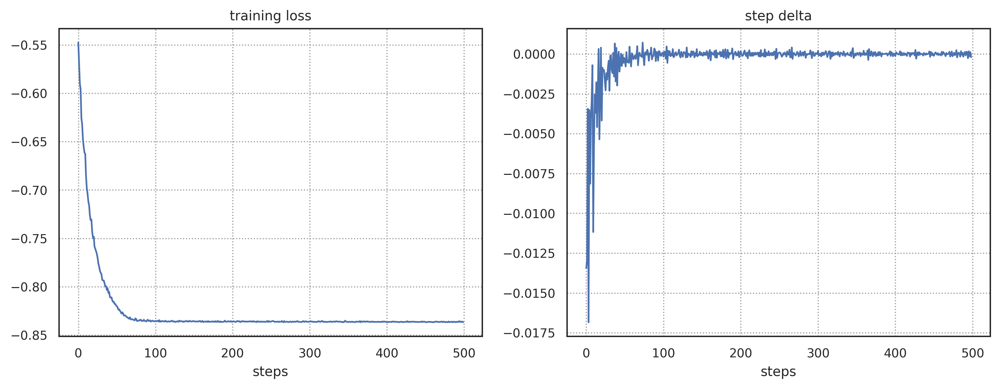

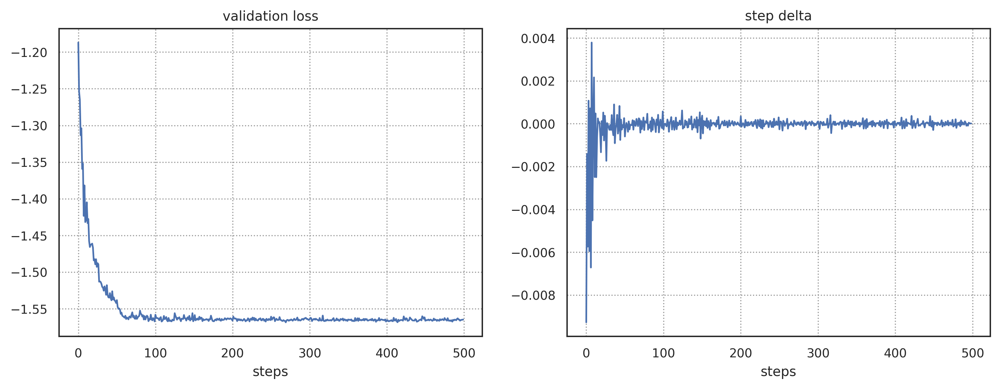

In [26]:
config = ec.tl.EchidnaConfig(
    timepoint_label = "timepoint", # `assert 'timepoint' in adata.obs.columns`
    counts_layer = "counts", # `assert 'counts' in list(adata.layers.keys())`
    clusters = "leiden", # `assert 'leiden' in adata.obs.columns`
    inverse_gamma = True, # Inverse Gamma can be more stable in low data settings
    eta_mean_init = eta_mean_init, # Our genes average approximately two copies
    q_corr_init=q_corr_init,
    q_shape_rate_scaler=q_shape_rate_scaler,
    lkj_concentration=lkj_concentration,
    patience = -1, # turn off early stopping
    n_steps = 500, # Passes through the dataset
)
ec.tl.echidna_train(
     adata # single cell anndata
    , wdf.loc[:,"counts"] # Copy number pd.DataFrame, indexed with genes. Select for "on" timepoint.
    , config # config settings
)

In [27]:
ec.tl.echidna_clones(adata, method='manual', metric="smoothed_corr", threshold=0.3)

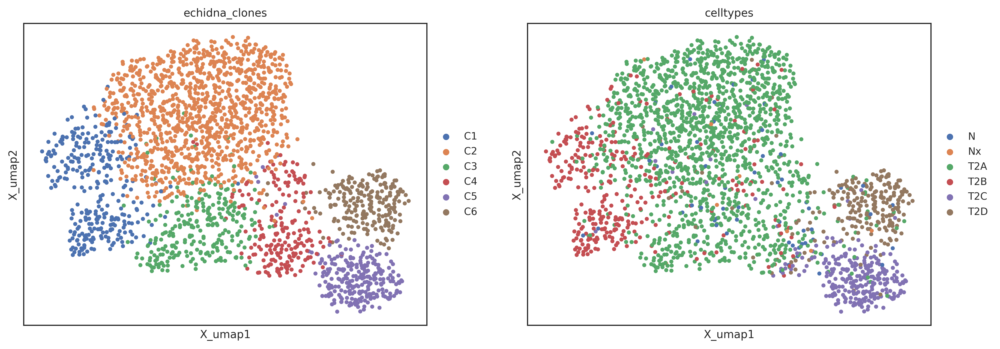

In [28]:
ec.pl.echidna(adata, ["echidna_clones", "celltypes"])

In [29]:
tumor2 = adata.copy()
tumor2

AnnData object with n_obs × n_vars = 2337 × 18675
    obs: 'celltypes', 'celltypes_RNA', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'leiden', 'timepoint', 'echidna_split', 'leiden_categorical', 'echidna_clones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'echidna_matched_genes', 'echidna_W_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'echidna', 'echidna_clones_colors', 'celltypes_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [30]:
tumor2.obs['barcode_infercnv'] = [i.split("_")[0] for i in tumor2.obs_names]
tumor2.obs['barcode_numbat'] = [i.split("_")[0][:-1] for i in tumor2.obs_names]
tumor2.obs['barcode_orig'] = tumor2.obs_names

In [31]:
adata = tumor5
wdf = wdf_tumor5
num_cells = adata.shape[1]
num_genes = adata.shape[-1]
num_clusters = len(adata.obs['leiden'].unique())
q_corr_init = 0.1
q_shape_rate_scaler = 10.0
eta_mean_init = wdf['counts'].mean()
lkj_concentration = 1.0

training loss: 0.1114 | validation loss: 0.0254: 100%|██████████| 500/500 [00:32<00:00, 15.37it/s]


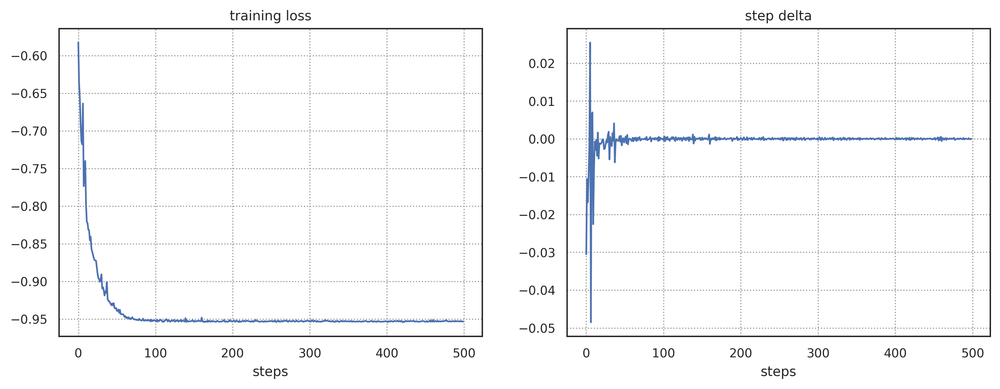

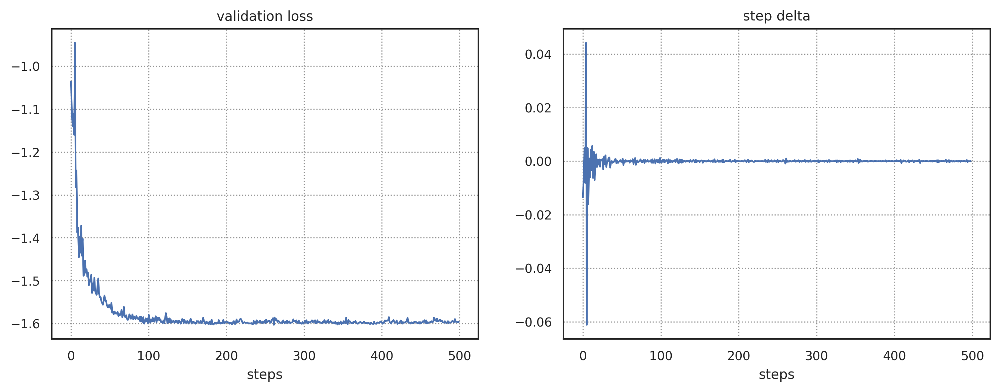

In [32]:
config = ec.tl.EchidnaConfig(
    timepoint_label = "timepoint", # `assert 'timepoint' in adata.obs.columns`
    counts_layer = "counts", # `assert 'counts' in list(adata.layers.keys())`
    clusters = "leiden", # `assert 'leiden' in adata.obs.columns`
    inverse_gamma = True, # Inverse Gamma can be more stable in low data settings
    eta_mean_init = eta_mean_init, # Our genes average approximately two copies
    q_corr_init=q_corr_init,
    q_shape_rate_scaler=q_shape_rate_scaler,
    lkj_concentration=lkj_concentration,
    patience = -1, # turn off early stopping
    n_steps = 500, # Passes through the dataset
)
ec.tl.echidna_train(
     adata # single cell anndata
    , wdf.loc[:,"counts"] # Copy number pd.DataFrame, indexed with genes. Select for "on" timepoint.
    , config # config settings
)

In [33]:
ec.tl.echidna_clones(adata, method='manual', metric="smoothed_corr", threshold=0.05)

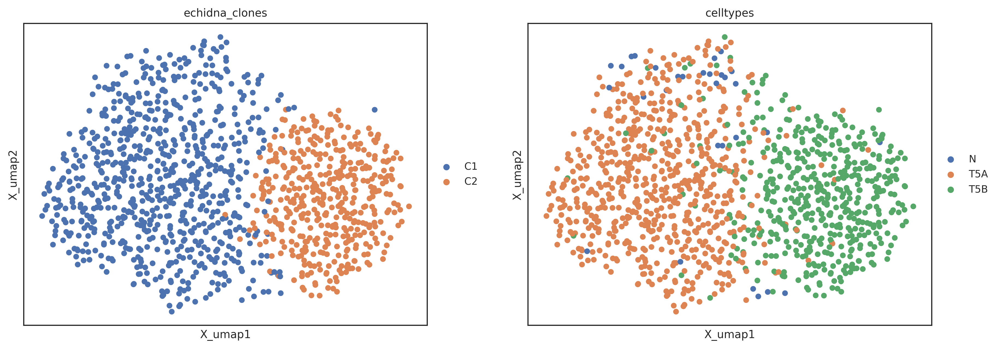

In [34]:
ec.pl.echidna(adata, ["echidna_clones", "celltypes"])

In [35]:
tumor5 = adata.copy()
tumor5

AnnData object with n_obs × n_vars = 1194 × 18675
    obs: 'celltypes', 'celltypes_RNA', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'leiden', 'timepoint', 'echidna_split', 'leiden_categorical', 'echidna_clones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'echidna_matched_genes', 'echidna_W_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'echidna', 'echidna_clones_colors', 'celltypes_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [36]:
tumor5.obs['barcode_infercnv'] = [i.split("_")[0] for i in tumor5.obs_names]
tumor5.obs['barcode_numbat'] = [i.split("_")[0][:-1] for i in tumor5.obs_names]
tumor5.obs['barcode_orig'] = tumor5.obs_names
tumor5.obs['ground_truth_clones'] = tumor5.obs['celltypes']

In [37]:
ground_truth_clone_colors = [
    "#300b0f", "#28170a", "#a776a7", "#f0c688", "#87836c", "#c9c53f"
]
ground_truth_clone_colors_t5 = [
    "blue", "#28170a", "#a776a7", "#f0c688", "#87836c", "#c9c53f"
]
echidna_clone_colors = [
    "#6fe3b6", "#efd5d1", "#181a75", "#d47372", "#acc2b8", "#a04cd0"
]
inferCNV_clone_colors = [
    "#a4b313", "#023536", "#515251", "#6c9576"
]
numbat_clone_colors = [
    "#a30152", "#3a4209", "#5bbce8", "#5b7a75", "#df3f8e", "#b9d0df", "black"
]
expression_clone_colors = [
    "#1d3e4d", "#c3636b", "#ec7c19", "#9281d7", "#423c40", "#524057"
]

annot = "ground_truth_clones"
tumor2.uns[f"{annot}_colors"] = ground_truth_clone_colors
tumor2.uns["echidna_clones_colors"] = echidna_clone_colors
tumor2.uns["inferCNV_clones_colors"] = inferCNV_clone_colors
tumor2.uns["numbat_clones_colors"] = numbat_clone_colors
tumor2.uns["expression_clones_colors"] = expression_clone_colors

In [154]:
annot = "ground_truth_clones"
tumor5.uns[f"{annot}_colors"] = ground_truth_clone_colors
tumor5.uns["echidna_clones_colors"] = echidna_clone_colors
tumor5.uns["inferCNV_clones_colors"] = inferCNV_clone_colors
tumor5.uns["numbat_clones_colors"] = numbat_clone_colors
tumor5.uns["expression_clones_colors"] = expression_clone_colors
annot = "ground_truth_clones"
tumor5.uns[f"{annot}_colors"] = ground_truth_clone_colors_t5

In [40]:
tumor2.obs['leiden'] = tumor2.obs['leiden'].astype(str)
tumor2.obs['ground_truth_clones'] = tumor2.obs['celltypes']

In [41]:
annot = "ground_truth_clones"
tumor2.uns[f"{annot}_colors"] = ground_truth_clone_colors
tumor2.uns["echidna_clones_colors"] = echidna_clone_colors
tumor2.uns["inferCNV_clones_colors"] = inferCNV_clone_colors

In [42]:
sc.set_figure_params(scanpy=True, fontsize=14)

In [44]:
ech_tumor2 = ec.tl.load_model(tumor2)
eta_tumor2 = ech_tumor2.eta_posterior

In [45]:
tumor2.obs_names = tumor2.obs['barcode_orig']

In [46]:
DNA_tumor2 =  pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/Tumors/Tumor 2/DNA_bin_counts_matrix.txt", sep='\t')
map = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/bin-boundaries and genes.txt",sep='\t')
eta_df_tumor2 = pd.DataFrame(eta_tumor2.cpu().detach().numpy(), columns=tumor2.var_names)
eta_binned, discard_bins = binning_eta(eta_df_tumor2)
_, DNA_cluster = get_binned_DNA(tumor2, DNA_tumor2, map, eta_tumor2)
valid_bins = [bin for bin in list(DNA_cluster.columns) if bin not in discard_bins]
DNA_cluster = DNA_cluster[valid_bins]

In [47]:
DNA_cluster

,0,1,2,3,4,5,6,7,8,9,...,271,272,273,274,275,276,277,278,279,280
0,2.587798,2.886495,2.005488,2.383187,2.041201,2.164904,2.214401,2.230466,2.645158,2.202723,...,2.055383,2.040276,2.699714,2.175498,1.914041,2.278934,2.700728,2.127516,1.214204,1.486777
1,2.455456,2.983377,2.001624,2.495571,2.157724,2.105547,2.308037,2.136039,2.349191,2.218938,...,2.126433,2.112650,2.739667,2.099360,2.056834,2.205085,2.920238,2.210749,1.260158,1.588785
2,2.592613,2.679372,2.020204,2.483375,2.103293,2.061808,2.415059,2.262017,2.372682,2.312046,...,2.347760,2.214464,2.854585,2.302923,2.180495,2.249975,2.513198,2.332202,1.329168,1.619016
3,2.488511,2.946498,2.021058,2.456916,2.030953,2.157887,2.317076,2.243370,2.517878,2.335649,...,2.074655,2.039708,2.853072,2.080610,1.992174,2.215392,2.659193,2.134018,1.268604,1.489175
4,1.683464,1.431446,1.613348,2.491993,2.092861,2.069679,2.411744,2.254237,2.377740,2.346368,...,2.276026,2.204184,3.001759,2.272607,2.122295,2.266150,2.590491,2.365384,1.214817,1.590120
5,1.624227,1.494440,1.420588,2.207119,1.976791,1.874944,2.005459,1.293581,1.335141,1.318433,...,2.333771,2.133857,3.075027,2.074349,1.909249,2.087975,2.339959,2.512648,1.186727,1.631151
6,2.339710,2.198493,1.837915,2.378183,2.064699,2.071444,2.293750,2.142072,2.112015,2.127316,...,2.287136,2.237845,3.016453,2.235690,2.108261,2.200324,2.439834,2.305453,1.366798,1.596204
7,2.487174,2.879942,2.170689,2.558009,2.185589,2.014815,2.373179,2.332551,2.411921,2.291988,...,2.154464,2.295844,2.979804,2.127649,1.999201,2.286987,2.898356,2.398089,1.731597,1.855907
8,2.586629,2.871282,2.419873,2.574250,2.224162,2.068847,2.422074,2.376216,2.528954,2.478362,...,2.138312,2.105384,2.914309,2.174701,2.224253,2.378098,2.977745,2.666874,1.751466,2.073667
9,2.413531,2.691155,1.930745,2.459397,2.161623,2.145172,2.305472,2.197487,2.450192,2.364566,...,2.103317,2.050828,2.622898,2.233072,2.039096,2.252687,2.791126,2.117678,1.240366,1.378240


In [48]:
corr_dna = np.corrcoef(DNA_cluster)
corr_dna.shape

(10, 10)

In [49]:
corr_eta = np.corrcoef(eta_binned)
corr_eta.shape

(10, 10)

In [50]:
from scipy.cluster.hierarchy import linkage, leaves_list, dendrogram

# Figure S2d

In [51]:
tumor2.obs_names = tumor2.obs['barcode_orig']

In [52]:
tumor2.obs['leiden'] = tumor2.obs['leiden'].astype(str)

In [53]:
label_to_remove = '9'
tumor2_no_noise = tumor2[tumor2.obs['leiden'] != label_to_remove].copy()
new_labels, _ = pd.factorize(tumor2_no_noise.obs['leiden'].astype(int).values)
tumor2_no_noise.obs['leiden_new'] = new_labels.astype(str)

In [54]:
tumor2_no_noise.obs['echidna_clones_before_dropping'] = tumor2_no_noise.obs['echidna_clones']

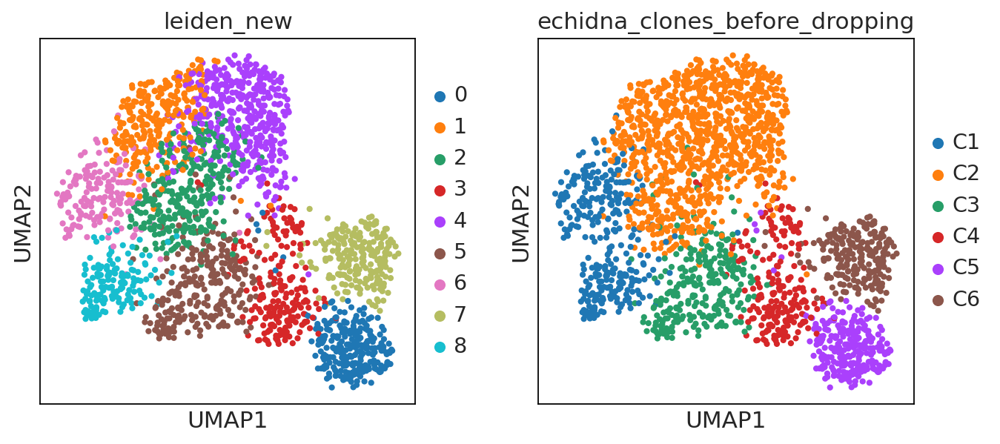

In [55]:
sc.pl.umap(tumor2_no_noise, color=['leiden_new', 'echidna_clones_before_dropping'])

In [56]:
adata = tumor2_no_noise
wdf = wdf_tumor2
num_cells = adata.shape[1]
num_genes = adata.shape[-1]
num_clusters = len(adata.obs['leiden_new'].unique())
q_corr_init = 0.1
q_shape_rate_scaler = 10.0
eta_mean_init = wdf['counts'].mean()
lkj_concentration = 1.0

In [57]:
adata

AnnData object with n_obs × n_vars = 2197 × 18675
    obs: 'celltypes', 'celltypes_RNA', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'leiden', 'timepoint', 'echidna_split', 'leiden_categorical', 'echidna_clones', 'barcode_infercnv', 'barcode_numbat', 'barcode_orig', 'ground_truth_clones', 'leiden_new', 'echidna_clones_before_dropping'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'echidna_matched_genes', 'echidna_W_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'echidna', 'echidna_clones_colors', 'celltypes_colors', 'ground_truth_clones_colors', 'inferCNV_clones_colors', 'numbat_clones_colors', 'expression_clones_colors', 'leiden_colors', 'leiden_new_colors', 'echidna_cl

training loss: 0.1454 | validation loss: 0.0271: 100%|██████████| 500/500 [00:37<00:00, 13.49it/s]


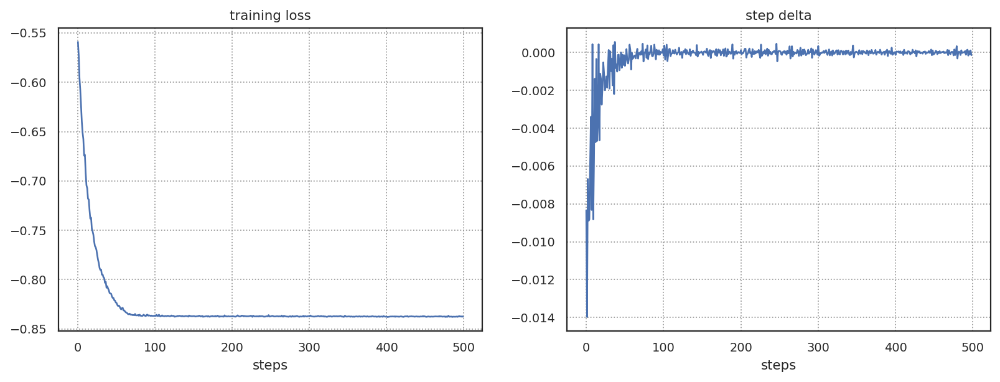

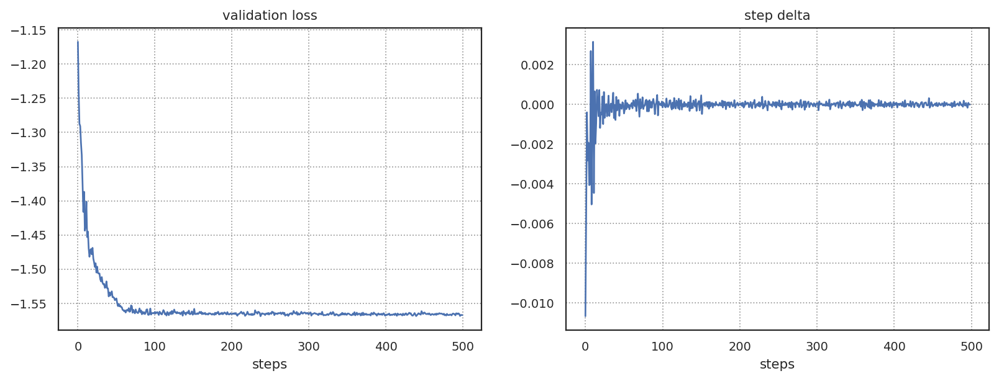

In [58]:
config = ec.tl.EchidnaConfig(
    timepoint_label = "timepoint",
    counts_layer = "counts",
    clusters = "leiden_new",
    inverse_gamma = True,
    eta_mean_init = eta_mean_init,
    q_corr_init=q_corr_init,
    q_shape_rate_scaler=q_shape_rate_scaler,
    lkj_concentration=lkj_concentration,
    patience = -1, # turn off early stopping
    n_steps = 500, # Passes through the dataset
)
ec.tl.echidna_train(
     adata # single cell anndata
    , wdf.loc[:,"counts"] # Copy number pd.DataFrame, indexed with genes. Select for "on" timepoint.
    , config # config settings
)

In [59]:
ec.tl.echidna_clones(adata, method='manual', metric="smoothed_corr", threshold=0.3)

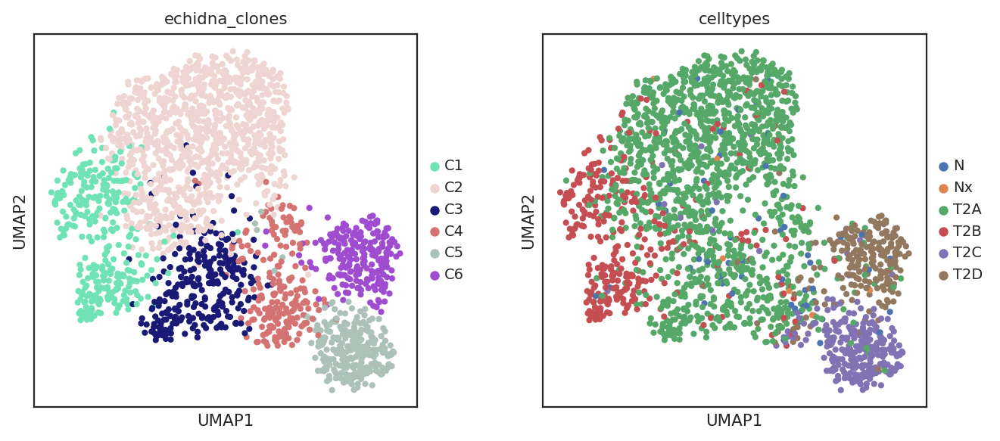

In [60]:
sc.pl.umap(adata, color=['echidna_clones', 'celltypes'])

In [61]:
adata.obs['echidna_clones_after_dropping'] = adata.obs['echidna_clones']

In [62]:
tumor2.uns["echidna_clones_before_dropping_colors"] = echidna_clone_colors
tumor2.uns["echidna_clones_after_dropping_colors"] = echidna_clone_colors

In [63]:
tumor2_no_noise = adata.copy()
tumor2_no_noise

AnnData object with n_obs × n_vars = 2197 × 18675
    obs: 'celltypes', 'celltypes_RNA', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'leiden', 'timepoint', 'echidna_split', 'leiden_categorical', 'echidna_clones', 'barcode_infercnv', 'barcode_numbat', 'barcode_orig', 'ground_truth_clones', 'leiden_new', 'echidna_clones_before_dropping', 'leiden_new_categorical', 'echidna_clones_after_dropping'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'echidna_matched_genes', 'echidna_W_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'echidna', 'echidna_clones_colors', 'celltypes_colors', 'ground_truth_clones_colors', 'inferCNV_clones_colors', 'numbat_clones_colors', 'expression_clones

In [64]:
tumor2.obs['echidna_clones_before_dropping'] = tumor2.obs['echidna_clones']

In [65]:
tumor2_no_noise.obs['leiden_new'] = tumor2_no_noise.obs['leiden_new'].astype(str)

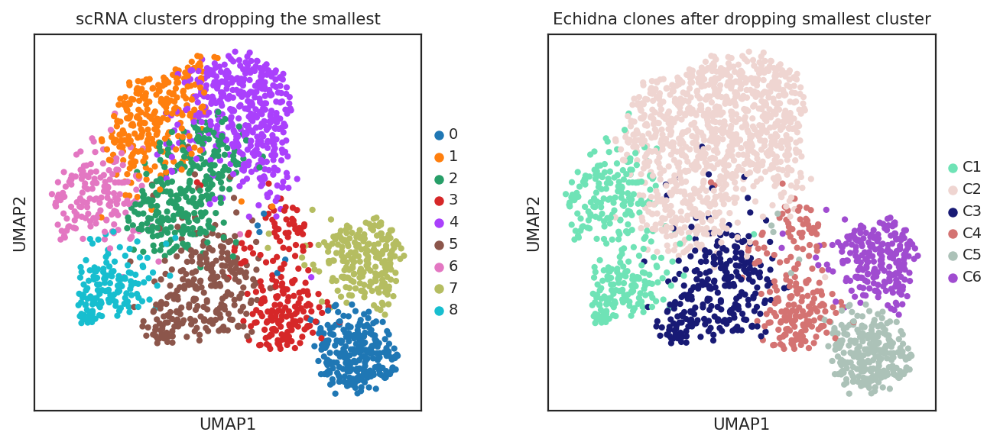

In [68]:
sc.pl.umap(tumor2_no_noise, color=['leiden_new', 'echidna_clones'],
           title=['scRNA clusters dropping the smallest',
                  'Echidna clones after dropping smallest cluster'])

#plt.savefig("figS1d_echidna_clone_after_dropping.svg", format='svg')

# Figure S2e

In [75]:
ech_tumor2_no_noise = ec.tl.load_model(tumor2_no_noise)
eta_tumor2_no_noise = ech_tumor2_no_noise.eta_posterior

In [76]:
eta_tumor2_no_noise.shape

torch.Size([9, 18675])

In [87]:
eta_df_tumor2_no_noise = pd.DataFrame(eta_tumor2_no_noise.cpu().detach().numpy(), columns=tumor2.var_names)
eta_tumor2_no_noise_binned, discard_bins = binning_eta(eta_df_tumor2_no_noise)

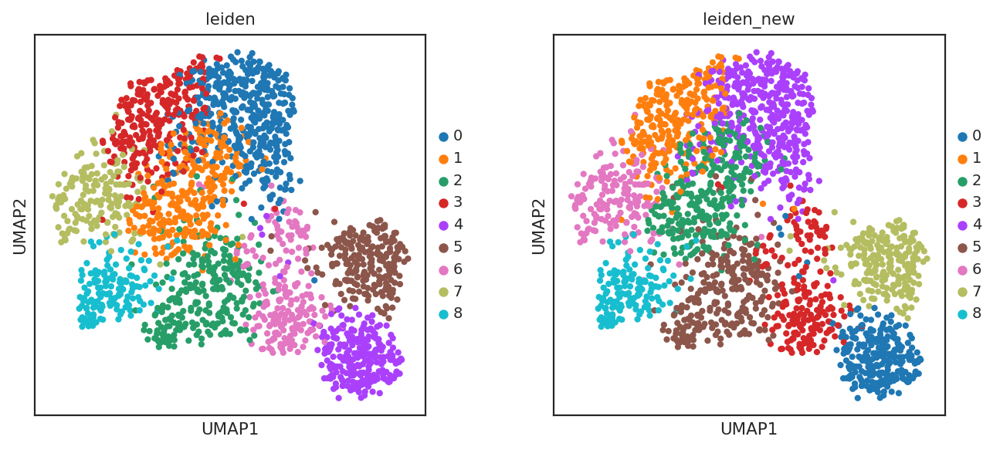

In [74]:
sc.pl.umap(tumor2_no_noise, color=['leiden', 'leiden_new'])

In [78]:
clust_map = {"0":"4", "1":"3", "2":"1", "3":"6", "4":"0", "5":"2", "6":"7", "7":"5", "8":"8"} # mapping leiden labels old->new

In [79]:
index_mapping = {int(v): int(k) for v, k in clust_map.items()} # NEW TO OLD
index_mapping = dict(sorted(index_mapping.items()))
index_mapping

{0: 4, 1: 3, 2: 1, 3: 6, 4: 0, 5: 2, 6: 7, 7: 5, 8: 8}

In [80]:
index_mapping.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [99]:
from scipy.ndimage import gaussian_filter1d
eta = eta_tumor2_no_noise.cpu().detach().numpy()
eta = gaussian_filter1d(eta, sigma=6, axis=1, radius=8)
eta_df_tumor2_no_noise = pd.DataFrame(eta, columns=tumor2_no_noise.var_names)
eta_binned, discard_bins = binning_eta(eta_df_tumor2_no_noise)

In [100]:
corr_eta = np.corrcoef(eta_binned)
corr_eta.shape

(9, 9)

In [101]:
current_indices = list(index_mapping.keys())
new_indices = list(index_mapping.values())

# Reorder rows
reordered = corr_dna[current_indices, :]
reordered = corr_dna[new_indices, :]

# Reorder columns
reordered = reordered[:, current_indices]
reordered = reordered[:, new_indices]

In [102]:
np.linalg.norm(corr_eta - reordered, ord="fro")

0.8736024837826575

[]

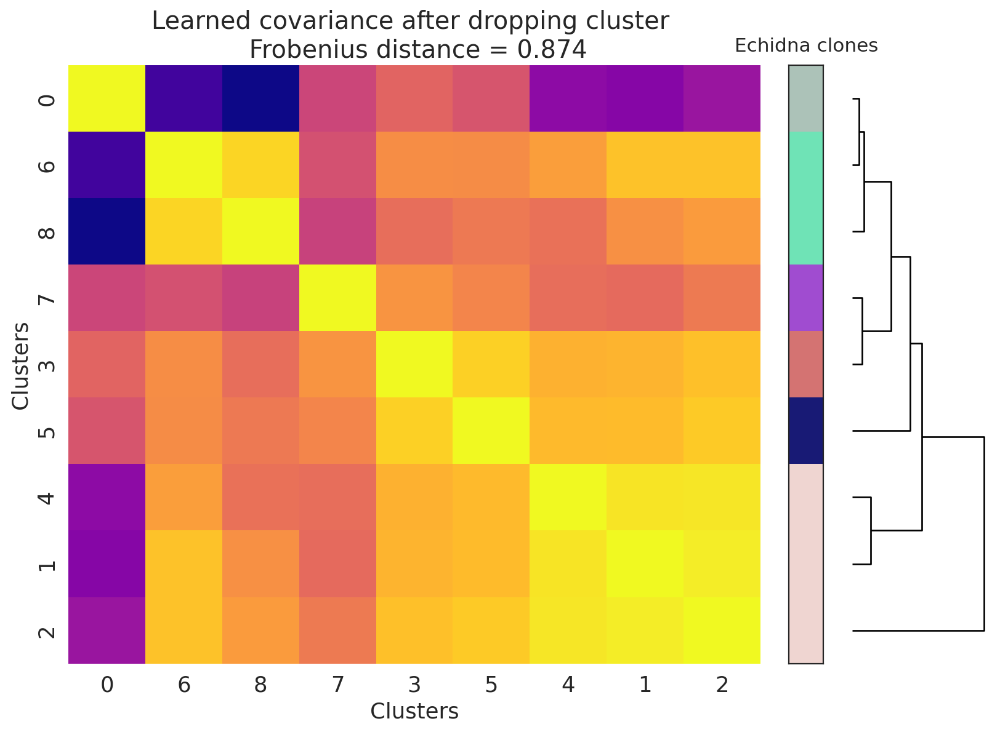

In [104]:
linkage_matrix = linkage(corr_eta, method='ward')
ordered_indices = leaves_list(linkage_matrix)

# Reorder the covariance matrices
cov_matrix2_ordered = corr_eta[np.ix_(ordered_indices, ordered_indices)]

cluster_assignments = [4, 0, 0, 5, 3, 2, 1, 1, 1]
cluster_colors = echidna_clone_colors
cmap = ListedColormap(cluster_colors)
ordered_clusters = cluster_assignments

# Create a figure with gridspec
fig = plt.figure(figsize=(12, 8))
gs = fig.add_gridspec(1, 3, width_ratios=[20, 1, 4], wspace=0.1)

# Heatmap 1
ax_heatmap1 = fig.add_subplot(gs[0])
sns.heatmap(
    cov_matrix2_ordered,
    ax=ax_heatmap1,
    cmap='plasma',
    cbar=False,
    xticklabels=ordered_indices,
    yticklabels=ordered_indices
)
ax_heatmap1.set_title("Learned covariance after dropping cluster \n Frobenius distance = 0.874", fontsize=18)
ax_heatmap1.set_xlabel("Clusters", fontsize=16)
ax_heatmap1.set_ylabel("Clusters", fontsize=16)
ax_heatmap1.set_xticklabels(ax_heatmap1.get_xticklabels(), fontsize=16)
ax_heatmap1.set_yticklabels(ax_heatmap1.get_yticklabels(), fontsize=16)

# Cluster color bar for Heatmap 1
ax_colorbar1 = fig.add_subplot(gs[1])
color_matrix1 = np.array(ordered_clusters).reshape(-1, 1)
ax_colorbar1.imshow(color_matrix1, aspect='auto', cmap=cmap)
ax_colorbar1.set_xticks([])
ax_colorbar1.set_yticks([])
ax_colorbar1.set_title("Echidna clones", fontsize=14, pad=10)


ax_dendro = fig.add_subplot(gs[2])
dendrogram(
    linkage_matrix,
    orientation='right',
    ax=ax_dendro,
    no_labels=True,
    color_threshold=0,
    above_threshold_color='black',  # Set dendrogram lines to black
)

# Remove grid and make the dendrogram larger
ax_dendro.grid(False)  # Disable grid
ax_dendro.spines['top'].set_visible(False)  # Remove top border
ax_dendro.spines['right'].set_visible(False)  # Remove right border
ax_dendro.spines['bottom'].set_visible(False)  # Remove bottom border
ax_dendro.spines['left'].set_visible(False)  # Remove left border
ax_dendro.set_xticks([])  # Remove x-ticks
ax_dendro.set_yticks([])  # Remove y-ticks


#plt.savefig("figS1e_cov_after_dropping.svg", format='svg')

# Figure S2b

## inferCNV tumor 5

In [105]:
infercnv_5 = pd.read_csv('/content/drive/MyDrive/Azizi lab/echidna/CN_estimates_tumor5', index_col=0)
infercnv_5.head()

,AAACATAAAATGTCTGT1,AAACATAATTTCCGTTC1,AAACATACCTGCAATAT1,AAACATAGAACCTCATC1,AAACATAGCGTTTGATA1,AAACATAGTCACGTTAG1,AAACATATCCGGTCTAC1,AAACATATTTACCGTCT1,AAACATGAGGTATAAGC1,AAACATGATAGAACTAG1,...,TTTTATTAAGCTCGACA1,TTTTATTAAGCTGGTAT1,TTTTATTACCGTCAATA1,TTTTATTAGGAATAAGC1,TTTTATTATTCTAATTG1,TTTTATTATTCTACAAT1,TTTTATTATTCTAGTGT1,TTTTATTATTCTATTAA1,TTTTATTCTTCATGTGG1,TTTTATTGGTGCCAATA1
chr1.WASH7P,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044784,1.00033,1.00033,1.00033,1.00033
chr1.OR4F5,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044506,1.00033,1.00033,1.00033,1.00033
chr1.LOC100133331,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044244,1.00033,1.00033,1.00033,1.00033
chr1.LOC100288069,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044020,1.00033,1.00033,1.00033,1.00033
chr1.LINC00115,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.043839,1.00033,1.00033,1.00033,1.00033


In [106]:
infercnv_5.index = infercnv_5.index.str.split('.').str[-1]
infercnv_5

,AAACATAAAATGTCTGT1,AAACATAATTTCCGTTC1,AAACATACCTGCAATAT1,AAACATAGAACCTCATC1,AAACATAGCGTTTGATA1,AAACATAGTCACGTTAG1,AAACATATCCGGTCTAC1,AAACATATTTACCGTCT1,AAACATGAGGTATAAGC1,AAACATGATAGAACTAG1,...,TTTTATTAAGCTCGACA1,TTTTATTAAGCTGGTAT1,TTTTATTACCGTCAATA1,TTTTATTAGGAATAAGC1,TTTTATTATTCTAATTG1,TTTTATTATTCTACAAT1,TTTTATTATTCTAGTGT1,TTTTATTATTCTATTAA1,TTTTATTCTTCATGTGG1,TTTTATTGGTGCCAATA1
WASH7P,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044784,1.00033,1.00033,1.00033,1.00033
OR4F5,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044506,1.00033,1.00033,1.00033,1.00033
LOC100133331,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044244,1.00033,1.00033,1.00033,1.00033
LOC100288069,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.044020,1.00033,1.00033,1.00033,1.00033
LINC00115,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.043839,1.00033,1.00033,1.00033,1.00033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ARRDC1,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.000330,1.00033,1.00033,1.00033,1.00033
ARRDC1-AS1,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.000330,1.00033,1.00033,1.00033,1.00033
EHMT1,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.000330,1.00033,1.00033,1.00033,1.00033
CACNA1B,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,1.00033,...,1.00033,1.00033,1.00033,1.00033,1.00033,1.000330,1.00033,1.00033,1.00033,1.00033


In [107]:
infercnv_5 = infercnv_5.T

In [108]:
tumor5.obs_names = tumor5.obs['barcode_infercnv']

In [109]:
rows = tumor5.obs.index.intersection(infercnv_5.index)
columns = tumor5.var.index.intersection(infercnv_5.T.index)

In [110]:
eta_tumor5 = ec.tl.load_model(tumor5).eta_posterior
eta_df_tumor5 = pd.DataFrame(eta_tumor5.cpu().detach().numpy())
eta_df_tumor5.columns = tumor5.var_names

In [111]:
eta_tumor5.shape

torch.Size([5, 18675])

In [112]:
X_ = tumor5[rows, columns]
infercnv_5 = infercnv_5.loc[rows, columns]
eta_df_tumor5 = eta_df_tumor5.loc[:, columns]

In [113]:
print(X_.shape, infercnv_5.shape, eta_df_tumor5.shape)

(1194, 13063) (1194, 13063) (5, 13063)


In [114]:
X_.X = infercnv_5
cnv_features = []
for i in np.unique(X_.obs['leiden']):
  f = np.mean(X_[X_.obs['leiden'] == i].X, axis=0)
  cnv_features.append(f)
cnv_features = np.array(cnv_features)
cnv_df = pd.DataFrame(cnv_features)
cnv_df.columns = X_.var.index

In [115]:
tumor5.obs['leiden'] = tumor5.obs['leiden'].astype(str)

In [116]:
DNA_tumor5 =  pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/Tumors/Tumor 5/DNA_bin_counts_matrix.txt", sep='\t')
map = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/endometrial/bin-boundaries and genes.txt",sep='\t')
eta_df_tumor5 = pd.DataFrame(eta_tumor5.cpu().detach().numpy(), columns=tumor5.var_names)
eta_binned, discard_bins = binning_eta(eta_df_tumor5)
_, DNA_cluster = get_binned_DNA(tumor5, DNA_tumor5, map, eta_tumor5)
valid_bins = [bin for bin in list(DNA_cluster.columns) if bin not in discard_bins]
DNA_cluster = DNA_cluster[valid_bins]
DNA_cluster = DNA_cluster.dropna()

In [117]:
DNA_cluster

,0,1,2,3,4,5,6,7,8,9,...,271,272,273,274,275,276,277,278,279,280
0,1.615282,4.312475,1.625481,2.435486,2.985087,3.232496,2.402020,2.570154,2.416687,2.847828,...,1.295658,1.929981,2.880559,1.355060,1.080895,1.368031,1.659186,2.777073,1.590079,2.293189
1,1.558485,1.801432,1.565761,2.462949,2.738681,2.243159,2.629336,2.498332,2.016767,2.332534,...,1.678877,2.047064,2.815193,1.459782,1.061294,1.262223,1.875649,2.696005,1.428989,2.101816
2,1.522017,2.114805,1.461696,2.406519,2.896999,2.462845,2.571283,2.372398,2.374101,2.358601,...,1.519061,2.073305,2.621790,1.785219,1.022788,1.221225,1.455019,2.651880,1.410461,2.098597
3,1.577837,2.087521,1.465976,2.141261,2.915506,2.398736,2.560699,2.319713,2.169249,2.309782,...,1.527827,2.060394,2.783581,1.618708,0.989976,1.288968,1.537481,2.694135,1.403821,2.040891
4,1.781767,2.125956,1.595032,2.648626,2.627877,2.416778,2.514020,2.583608,2.183807,2.459525,...,1.444348,1.838049,2.761060,1.601469,1.157054,1.455361,1.702019,2.882025,1.552469,2.187838


In [118]:
infercnv_binned, discard_bins = binning_eta(cnv_df)
valid_bins_infercnv = [bin for bin in list(DNA_cluster.columns) if bin not in discard_bins]
DNA_cluster_infercnv = DNA_cluster[valid_bins_infercnv]

In [119]:
from sklearn.cluster import KMeans
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(infercnv_binned)
kmeans_labels_str = [str(i) for i in kmeans_labels]

In [120]:
leiden_clusters = tumor5.obs['leiden']
leiden_to_kmeans = dict(zip(np.unique(leiden_clusters), kmeans_labels_str))
tumor5.obs['inferCNV_clones'] = leiden_clusters.map(leiden_to_kmeans)
tumor5.obs['ground_truth_clones'] = tumor5.obs['celltypes']

## Numbat tumor 5

In [121]:
numbat_bulk = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/numbat_tumor5/bulk_clones_final.tsv.gz", sep='\t', compression='gzip')
numbat_bulk

,snp_id,CHROM,POS,cM,REF,ALT,GT,gene,AD,DP,...,cnv_state_post,p_up,haplo_post,haplo_naive,haplo_theta_min,major_count,minor_count,theta_hat_roll,phi_mle_roll,gamma
0,WASH7P,1,14362,NaN,NaN,NaN,NaN,WASH7P,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.150592,20
1,LOC729737,1,134773,NaN,NaN,NaN,NaN,LOC729737,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.136210,20
2,LOC100133331,1,661139,NaN,NaN,NaN,NaN,LOC100133331,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.120679,20
3,LOC100288069,1,700245,NaN,NaN,NaN,NaN,LOC100288069,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.102769,20
4,LINC00115,1,761586,NaN,NaN,NaN,NaN,LINC00115,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.093978,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154076,MAPK8IP2,22,51039222,NaN,NaN,NaN,NaN,MAPK8IP2,NaN,NaN,...,neu,NaN,NaN,NaN,NaN,NaN,NaN,0.477273,0.985624,20
154077,ARSA,22,51061182,NaN,NaN,NaN,NaN,ARSA,NaN,NaN,...,neu,NaN,NaN,NaN,NaN,NaN,NaN,0.477273,0.977536,20
154078,SHANK3,22,51112819,NaN,NaN,NaN,NaN,SHANK3,NaN,NaN,...,neu,NaN,NaN,NaN,NaN,NaN,NaN,0.477273,0.942432,20
154079,LOC105373100,22,51174257,NaN,NaN,NaN,NaN,LOC105373100,NaN,NaN,...,neu,NaN,NaN,NaN,NaN,NaN,NaN,0.477273,0.953767,20


In [122]:
numbat_bulk = numbat_bulk[numbat_bulk['LLR'] >= 10]
numbat_bulk

,snp_id,CHROM,POS,cM,REF,ALT,GT,gene,AD,DP,...,cnv_state_post,p_up,haplo_post,haplo_naive,haplo_theta_min,major_count,minor_count,theta_hat_roll,phi_mle_roll,gamma
0,WASH7P,1,14362,NaN,NaN,NaN,NaN,WASH7P,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.150592,20
1,LOC729737,1,134773,NaN,NaN,NaN,NaN,LOC729737,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.136210,20
2,LOC100133331,1,661139,NaN,NaN,NaN,NaN,LOC100133331,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.120679,20
3,LOC100288069,1,700245,NaN,NaN,NaN,NaN,LOC100288069,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.102769,20
4,LINC00115,1,761586,NaN,NaN,NaN,NaN,LINC00115,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.093978,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153712,21_47815251_G_C,21,47815251,64.541227,G,C,0|1,PCNT,1.0,1.0,...,del,1.376075e-07,major,major,minor,1.0,0.0,0.478102,0.600388,20
153713,21_47821588_A_G,21,47821588,64.541597,A,G,0|1,PCNT,2.0,2.0,...,del,9.587818e-09,major,major,minor,2.0,0.0,0.478102,0.600388,20
153714,21_47862624_A_G,21,47862624,64.546064,A,G,1|0,PCNT,0.0,1.0,...,del,5.674810e-05,minor,minor,minor,1.0,0.0,0.478102,0.600388,20
153715,DIP2A,21,47878862,NaN,NaN,NaN,NaN,DIP2A,NaN,NaN,...,del,NaN,NaN,NaN,minor,NaN,NaN,0.478102,0.598593,20


In [123]:
numbat_bulk = numbat_bulk[numbat_bulk['n_cells'] > 50]
numbat_bulk

,snp_id,CHROM,POS,cM,REF,ALT,GT,gene,AD,DP,...,cnv_state_post,p_up,haplo_post,haplo_naive,haplo_theta_min,major_count,minor_count,theta_hat_roll,phi_mle_roll,gamma
0,WASH7P,1,14362,NaN,NaN,NaN,NaN,WASH7P,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.150592,20
1,LOC729737,1,134773,NaN,NaN,NaN,NaN,LOC729737,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.136210,20
2,LOC100133331,1,661139,NaN,NaN,NaN,NaN,LOC100133331,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.120679,20
3,LOC100288069,1,700245,NaN,NaN,NaN,NaN,LOC100288069,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.102769,20
4,LINC00115,1,761586,NaN,NaN,NaN,NaN,LINC00115,NaN,NaN,...,loh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.093978,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153712,21_47815251_G_C,21,47815251,64.541227,G,C,0|1,PCNT,1.0,1.0,...,del,1.376075e-07,major,major,minor,1.0,0.0,0.478102,0.600388,20
153713,21_47821588_A_G,21,47821588,64.541597,A,G,0|1,PCNT,2.0,2.0,...,del,9.587818e-09,major,major,minor,2.0,0.0,0.478102,0.600388,20
153714,21_47862624_A_G,21,47862624,64.546064,A,G,1|0,PCNT,0.0,1.0,...,del,5.674810e-05,minor,minor,minor,1.0,0.0,0.478102,0.600388,20
153715,DIP2A,21,47878862,NaN,NaN,NaN,NaN,DIP2A,NaN,NaN,...,del,NaN,NaN,NaN,minor,NaN,NaN,0.478102,0.598593,20


In [124]:
gene_cnv = (numbat_bulk
            .groupby(['sample', 'gene'], as_index=False)
            .agg(median_phi_mle=('phi_mle', 'median')))
gene_cnv['est_cn'] = gene_cnv['median_phi_mle']
gene_cnv

,sample,gene,median_phi_mle,est_cn
0,1,A1BG,0.868013,0.868013
1,1,A1BG-AS1,0.868013,0.868013
2,1,A1CF,0.934483,0.934483
3,1,A2M,0.900801,0.900801
4,1,A2M-AS1,0.900801,0.900801
...,...,...,...,...
29754,6,ZW10,0.772462,0.772462
29755,6,ZWINT,0.797066,0.797066
29756,6,ZYG11B,1.517995,1.517995
29757,6,ZZEF1,0.980400,0.980400


In [125]:
gene_cnv['sample'].unique()

array([1, 2, 3, 4, 5, 6])

In [126]:
clone_by_gene = gene_cnv.pivot(index='sample', columns='gene', values='est_cn')
clone_by_gene.fillna(1.0, inplace=True)
clone_by_gene.index.names = ['clone_opt']
clone_by_gene

gene,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A3GALT2,AADACL4,AADAT,AAGAB,AAK1,...,ZSWIM8-AS1,ZSWIM9,ZUP1,ZW10,ZWILCH,ZWINT,ZYG11A,ZYG11B,ZZEF1,ZZZ3
clone_opt,,,,,,,,,,,,,,,,,,,,,
1,0.868013,0.868013,0.934483,0.900801,0.900801,0.881870,1.000000,0.729580,1.000000,0.916134,...,0.934483,0.868013,1.00000,0.953696,1.000000,0.934483,1.000000,1.000000,0.912566,1.000000
2,0.916513,0.916513,0.787111,0.886191,0.886191,0.929308,1.000000,0.720966,1.000000,0.795656,...,0.787111,0.916513,1.00000,0.802367,1.000000,1.000000,1.515209,1.515209,1.057165,1.515209
3,0.632065,0.632065,0.766273,0.811442,0.811442,1.000000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
4,1.000000,1.000000,0.816218,0.856762,0.856762,1.000000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
5,1.000000,0.894165,1.000000,0.882994,0.882994,1.000000,1.000000,0.738001,1.000000,0.859879,...,0.812825,0.894165,1.00000,0.773838,1.000000,1.000000,1.391562,1.391562,1.003167,1.391562
6,1.000000,1.000000,0.797066,1.000000,1.000000,1.000000,1.000000,0.692705,1.000000,0.746279,...,0.797066,1.000000,1.00000,0.772462,1.000000,0.797066,1.000000,1.517995,0.980400,1.517995


In [127]:
numbat_clones = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/numbat_tumor5/clone_post_2.tsv", sep='\t')
numbat_clones.head()

,cell,clone_opt,GT_opt,p_opt,p_1,p_2,p_3,p_4,p_5,p_6,...,p_y_1,p_y_2,p_y_3,p_y_4,p_y_5,p_y_6,p_cnv,p_cnv_x,p_cnv_y,compartment_opt
0,AAACATAAAATGTCTGT,1,NaN,0.983789,9.837885e-01,0.014512,0.000012,0.000224,1.120174e-04,0.001352,...,0.034887,0.015971,0.046572,0.872224,0.014374,0.015971,0.016211,0.007053,0.965113,normal
1,AAACATAATTTCCGTTC,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.760826,5.190535e-07,0.000039,0.239036,0.760826,2.397662e-07,0.000098,...,0.143765,0.126257,0.113631,0.366358,0.022726,0.227262,0.999999,0.999996,0.856235,tumor
2,AAACATAGCGTTTGATA,3,"10c,2a,8c,11d,1b,13c,19a_del",0.722455,9.981948e-04,0.048148,0.722455,0.116506,2.466579e-02,0.087227,...,0.101672,0.215770,0.215770,0.035247,0.215770,0.215770,0.999002,0.993406,0.898328,tumor
3,AAACATAGTCACGTTAG,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.674789,2.774212e-09,0.000038,0.325170,0.674789,1.755651e-06,0.000001,...,0.002897,0.056985,0.166169,0.349296,0.092316,0.332337,1.000000,0.999999,0.997103,tumor
4,AAACATATCCGGTCTAC,3,"10c,2a,8c,11d,1b,13c,19a_del",0.569114,1.842953e-03,0.004586,0.569114,0.136239,2.867187e-01,0.001499,...,0.092853,0.013178,0.124502,0.030190,0.726098,0.013178,0.998157,0.990115,0.907147,tumor


In [128]:
numbat_clones.index = numbat_clones['cell']
numbat_clones.head()

,cell,clone_opt,GT_opt,p_opt,p_1,p_2,p_3,p_4,p_5,p_6,...,p_y_1,p_y_2,p_y_3,p_y_4,p_y_5,p_y_6,p_cnv,p_cnv_x,p_cnv_y,compartment_opt
cell,,,,,,,,,,,,,,,,,,,,,
AAACATAAAATGTCTGT,AAACATAAAATGTCTGT,1,NaN,0.983789,9.837885e-01,0.014512,0.000012,0.000224,1.120174e-04,0.001352,...,0.034887,0.015971,0.046572,0.872224,0.014374,0.015971,0.016211,0.007053,0.965113,normal
AAACATAATTTCCGTTC,AAACATAATTTCCGTTC,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.760826,5.190535e-07,0.000039,0.239036,0.760826,2.397662e-07,0.000098,...,0.143765,0.126257,0.113631,0.366358,0.022726,0.227262,0.999999,0.999996,0.856235,tumor
AAACATAGCGTTTGATA,AAACATAGCGTTTGATA,3,"10c,2a,8c,11d,1b,13c,19a_del",0.722455,9.981948e-04,0.048148,0.722455,0.116506,2.466579e-02,0.087227,...,0.101672,0.215770,0.215770,0.035247,0.215770,0.215770,0.999002,0.993406,0.898328,tumor
AAACATAGTCACGTTAG,AAACATAGTCACGTTAG,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.674789,2.774212e-09,0.000038,0.325170,0.674789,1.755651e-06,0.000001,...,0.002897,0.056985,0.166169,0.349296,0.092316,0.332337,1.000000,0.999999,0.997103,tumor
AAACATATCCGGTCTAC,AAACATATCCGGTCTAC,3,"10c,2a,8c,11d,1b,13c,19a_del",0.569114,1.842953e-03,0.004586,0.569114,0.136239,2.867187e-01,0.001499,...,0.092853,0.013178,0.124502,0.030190,0.726098,0.013178,0.998157,0.990115,0.907147,tumor


In [129]:
len(numbat_clones)

1193

In [130]:
len(tumor5.obs_names)

1194

In [131]:
tumor5.obs_names = tumor5.obs['barcode_numbat']
len(tumor5.obs_names)

1194

In [132]:
overlapping_barcodes = set(tumor5.obs_names).intersection(set(numbat_clones.index))
len(overlapping_barcodes)

1193

In [133]:
tumor5 = tumor5[tumor5.obs_names.isin(overlapping_barcodes)]
tumor5

View of AnnData object with n_obs × n_vars = 1193 × 18675
    obs: 'celltypes', 'celltypes_RNA', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'leiden', 'timepoint', 'echidna_split', 'leiden_categorical', 'echidna_clones', 'barcode_infercnv', 'barcode_numbat', 'barcode_orig', 'ground_truth_clones', 'inferCNV_clones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'echidna_matched_genes', 'echidna_W_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'echidna', 'celltypes_colors', 'inferCNV_clones_colors', 'numbat_clones_colors', 'expression_clones_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [134]:
numbat_clones = numbat_clones.loc[list(overlapping_barcodes)]
numbat_clones

,cell,clone_opt,GT_opt,p_opt,p_1,p_2,p_3,p_4,p_5,p_6,...,p_y_1,p_y_2,p_y_3,p_y_4,p_y_5,p_y_6,p_cnv,p_cnv_x,p_cnv_y,compartment_opt
cell,,,,,,,,,,,,,,,,,,,,,
GACATGAAAGATGTACA,GACATGAAAGATGTACA,3,"10c,2a,8c,11d,1b,13c,19a_del",0.456293,1.448648e-09,0.047205,0.456293,0.450461,0.003341,0.042700,...,0.000116,0.172394,0.172394,0.172394,0.172394,0.310309,1.000000,0.999989,0.999884,tumor
GCAACAGAGGTAGTTAG,GCAACAGAGGTAGTTAG,3,"10c,2a,8c,11d,1b,13c,19a_del",0.472701,2.516422e-11,0.030091,0.472701,0.305418,0.054257,0.137533,...,0.047376,0.159353,0.286836,0.187728,0.159353,0.159353,1.000000,1.000000,0.952624,tumor
TTTGGGGATAGACGATG,TTTGGGGATAGACGATG,3,"10c,2a,8c,11d,1b,13c,19a_del",0.936748,8.477028e-05,0.002958,0.936748,0.001336,0.000530,0.058343,...,0.444507,0.038811,0.407423,0.000589,0.069860,0.038811,0.999915,0.999845,0.555493,tumor
GGATGAAGTGAGGTTAG,GGATGAAGTGAGGTTAG,3,"10c,2a,8c,11d,1b,13c,19a_del",0.602789,4.809157e-03,0.002667,0.602789,0.389470,0.000018,0.000247,...,0.092435,0.151816,0.273269,0.178849,0.151816,0.151816,0.995191,0.944212,0.907565,tumor
AAACCGGAACAACTAAG,AAACCGGAACAACTAAG,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.894597,1.098200e-02,0.003077,0.048386,0.894597,0.042659,0.000299,...,0.000387,0.013932,0.045138,0.845363,0.081249,0.013932,0.989018,0.020029,0.999613,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTATTTGAACAAACACA,GTATTTGAACAAACACA,5,"10c,2a,8c,11d,1b,16b,19a_loh",0.714846,8.625092e-03,0.238832,0.000011,0.000036,0.714846,0.037650,...,0.005144,0.065376,0.190636,0.614630,0.058838,0.065376,0.991375,0.661452,0.994856,tumor
TCATCATAAACCTCTAC,TCATCATAAACCTCTAC,6,"10c,2a,8c,11d,1b,21a",0.491221,2.837547e-14,0.093971,0.323889,0.001070,0.089850,0.491221,...,0.002134,0.059652,0.563579,0.001885,0.313099,0.059652,1.000000,1.000000,0.997866,tumor
TCAACTGACCATCAAGT,TCAACTGACCATCAAGT,3,"10c,2a,8c,11d,1b,13c,19a_del",0.955839,5.570773e-09,0.000352,0.955839,0.041558,0.001533,0.000718,...,0.005085,0.016271,0.896529,0.039484,0.026359,0.016271,1.000000,0.999998,0.994915,tumor


In [135]:
numbat_clones = numbat_clones.reindex(tumor5.obs_names)
numbat_clones

,cell,clone_opt,GT_opt,p_opt,p_1,p_2,p_3,p_4,p_5,p_6,...,p_y_1,p_y_2,p_y_3,p_y_4,p_y_5,p_y_6,p_cnv,p_cnv_x,p_cnv_y,compartment_opt
barcode_numbat,,,,,,,,,,,,,,,,,,,,,
AAACATAAAATGTCTGT,AAACATAAAATGTCTGT,1,NaN,0.983789,9.837885e-01,1.451162e-02,0.000012,0.000224,1.120174e-04,1.352210e-03,...,0.034887,0.015971,0.046572,0.872224,0.014374,0.015971,0.016211,0.007053,0.965113,normal
AAACATAATTTCCGTTC,AAACATAATTTCCGTTC,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.760826,5.190535e-07,3.859695e-05,0.239036,0.760826,2.397662e-07,9.847236e-05,...,0.143765,0.126257,0.113631,0.366358,0.022726,0.227262,0.999999,0.999996,0.856235,tumor
AAACATAGCGTTTGATA,AAACATAGCGTTTGATA,3,"10c,2a,8c,11d,1b,13c,19a_del",0.722455,9.981948e-04,4.814784e-02,0.722455,0.116506,2.466579e-02,8.722735e-02,...,0.101672,0.215770,0.215770,0.035247,0.215770,0.215770,0.999002,0.993406,0.898328,tumor
AAACATAGTCACGTTAG,AAACATAGTCACGTTAG,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.674789,2.774212e-09,3.820139e-05,0.325170,0.674789,1.755651e-06,1.160000e-06,...,0.002897,0.056985,0.166169,0.349296,0.092316,0.332337,1.000000,0.999999,0.997103,tumor
AAACATATCCGGTCTAC,AAACATATCCGGTCTAC,3,"10c,2a,8c,11d,1b,13c,19a_del",0.569114,1.842953e-03,4.586410e-03,0.569114,0.136239,2.867187e-01,1.499150e-03,...,0.092853,0.013178,0.124502,0.030190,0.726098,0.013178,0.998157,0.990115,0.907147,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTATTAAGCTGGTAT,TTTTATTAAGCTGGTAT,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.558961,1.706169e-01,4.655179e-02,0.175614,0.558961,2.990016e-03,4.526598e-02,...,0.021221,0.135488,0.135488,0.436827,0.135488,0.135488,0.829383,0.075342,0.978779,tumor
TTTTATTACCGTCAATA,TTTTATTACCGTCAATA,3,"10c,2a,8c,11d,1b,13c,19a_del",0.829646,1.851232e-06,1.462946e-03,0.829646,0.167891,2.602594e-05,9.722726e-04,...,0.344118,0.116043,0.187989,0.038535,0.104438,0.208877,0.999998,0.999997,0.655882,tumor
TTTTATTATTCTAATTG,TTTTATTATTCTAATTG,4,"10c,2a,8c,11d,1b,13c,19a_del,6e",0.972651,5.917487e-03,3.405127e-07,0.021431,0.972651,8.742945e-08,2.030907e-08,...,0.018602,0.031644,0.018455,0.848393,0.051263,0.031644,0.994083,0.591996,0.981398,tumor


In [136]:
tumor5.obs['numbat_clones'] = numbat_clones['clone_opt'].astype(str)

In [137]:
nb_clones = numbat_clones[['cell', 'clone_opt']]
nb_clones

,cell,clone_opt
barcode_numbat,,
AAACATAAAATGTCTGT,AAACATAAAATGTCTGT,1
AAACATAATTTCCGTTC,AAACATAATTTCCGTTC,4
AAACATAGCGTTTGATA,AAACATAGCGTTTGATA,3
AAACATAGTCACGTTAG,AAACATAGTCACGTTAG,4
AAACATATCCGGTCTAC,AAACATATCCGGTCTAC,3
...,...,...
TTTTATTAAGCTGGTAT,TTTTATTAAGCTGGTAT,4
TTTTATTACCGTCAATA,TTTTATTACCGTCAATA,3
TTTTATTATTCTAATTG,TTTTATTATTCTAATTG,4


In [138]:
nb_clones = nb_clones.dropna()
nb_clones

,cell,clone_opt
barcode_numbat,,
AAACATAAAATGTCTGT,AAACATAAAATGTCTGT,1
AAACATAATTTCCGTTC,AAACATAATTTCCGTTC,4
AAACATAGCGTTTGATA,AAACATAGCGTTTGATA,3
AAACATAGTCACGTTAG,AAACATAGTCACGTTAG,4
AAACATATCCGGTCTAC,AAACATATCCGGTCTAC,3
...,...,...
TTTTATTAAGCTGGTAT,TTTTATTAAGCTGGTAT,4
TTTTATTACCGTCAATA,TTTTATTACCGTCAATA,3
TTTTATTATTCTAATTG,TTTTATTATTCTAATTG,4


In [139]:
set(nb_clones['clone_opt']) - set(clone_by_gene.index)

set()

In [140]:
nb_cnv = nb_clones.join(clone_by_gene, on='clone_opt').drop(columns=['cell', 'clone_opt'])
nb_cnv

,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A3GALT2,AADACL4,AADAT,AAGAB,AAK1,...,ZSWIM8-AS1,ZSWIM9,ZUP1,ZW10,ZWILCH,ZWINT,ZYG11A,ZYG11B,ZZEF1,ZZZ3
barcode_numbat,,,,,,,,,,,,,,,,,,,,,
AAACATAAAATGTCTGT,0.868013,0.868013,0.934483,0.900801,0.900801,0.88187,1.000000,0.729580,1.000000,0.916134,...,0.934483,0.868013,1.00000,0.953696,1.000000,0.934483,1.000000,1.000000,0.912566,1.000000
AAACATAATTTCCGTTC,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
AAACATAGCGTTTGATA,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
AAACATAGTCACGTTAG,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
AAACATATCCGGTCTAC,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTATTAAGCTGGTAT,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
TTTTATTACCGTCAATA,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
TTTTATTATTCTAATTG,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417


In [141]:
nb_cnv = nb_cnv.dropna()
nb_cnv

,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A3GALT2,AADACL4,AADAT,AAGAB,AAK1,...,ZSWIM8-AS1,ZSWIM9,ZUP1,ZW10,ZWILCH,ZWINT,ZYG11A,ZYG11B,ZZEF1,ZZZ3
barcode_numbat,,,,,,,,,,,,,,,,,,,,,
AAACATAAAATGTCTGT,0.868013,0.868013,0.934483,0.900801,0.900801,0.88187,1.000000,0.729580,1.000000,0.916134,...,0.934483,0.868013,1.00000,0.953696,1.000000,0.934483,1.000000,1.000000,0.912566,1.000000
AAACATAATTTCCGTTC,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
AAACATAGCGTTTGATA,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
AAACATAGTCACGTTAG,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
AAACATATCCGGTCTAC,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTATTAAGCTGGTAT,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417
TTTTATTACCGTCAATA,0.632065,0.632065,0.766273,0.811442,0.811442,1.00000,1.000000,0.727712,1.029131,0.756192,...,0.766273,0.632065,1.00000,0.762743,1.029131,0.766273,1.486786,1.486786,0.877585,1.486786
TTTTATTATTCTAATTG,1.000000,1.000000,0.816218,0.856762,0.856762,1.00000,0.863562,0.718171,1.000000,0.785152,...,0.816218,0.672403,1.12166,0.783402,1.000000,1.000000,1.000000,1.440417,0.911538,1.440417


In [142]:
rows = tumor5.obs.index.intersection(nb_cnv.index)
columns = tumor5.var.index.intersection(nb_cnv.columns)
print(len(rows), len(columns))

1193 6174


In [143]:
eta_df_tumor5 = pd.DataFrame(eta_tumor5.cpu().detach().numpy())
eta_df_tumor5.columns = tumor5.var_names

In [144]:
X_ = tumor5[rows, columns]
nb_cnv = nb_cnv.loc[rows, columns]
eta_df_tumor5 = eta_df_tumor5.loc[:, columns]
print(X_.shape, nb_cnv.shape, eta_df_tumor5.shape)

(1193, 6174) (1193, 6174) (5, 6174)


In [145]:
X_.X = nb_cnv
cnv_features = []
for i in np.unique(X_.obs['leiden']):
  f = np.mean(X_[X_.obs['leiden'] == i].X, axis=0)
  cnv_features.append(f)
cnv_features = np.array(cnv_features)
numbat_cnv_df = pd.DataFrame(cnv_features)
numbat_cnv_df.columns = X_.var.index

In [146]:
numbat_binned, discard_bins = binning_eta(numbat_cnv_df)
valid_bins_numbat = [bin for bin in list(DNA_cluster.columns) if bin not in discard_bins]
DNA_cluster_numbat = DNA_cluster[valid_bins_numbat]

In [147]:
numbat_binned.shape

(5, 137)

In [292]:
np.save("numbat_binned.npy", numbat_binned)

In [293]:
np.save("infercnv_binned.npy", infercnv_binned)

In [296]:
DNA_cluster_numbat.to_csv("DNA_cluster_numbat.csv")

In [297]:
DNA_cluster_infercnv.to_csv("DNA_cluster_infercnv.csv")

## Look at clone calling for all methods

In [148]:
sc.set_figure_params(scanpy=True, fontsize=14)

In [155]:
annot = "ground_truth_clones"
tumor5.uns[f"{annot}_colors"] = ground_truth_clone_colors
tumor5.uns["echidna_clones_colors"] = echidna_clone_colors
tumor5.uns["inferCNV_clones_colors"] = inferCNV_clone_colors
tumor5.uns["numbat_clones_colors"] = numbat_clone_colors
tumor5.uns["expression_clones_colors"] = expression_clone_colors
annot = "ground_truth_clones"
tumor5.uns[f"{annot}_colors"] = ground_truth_clone_colors_t5

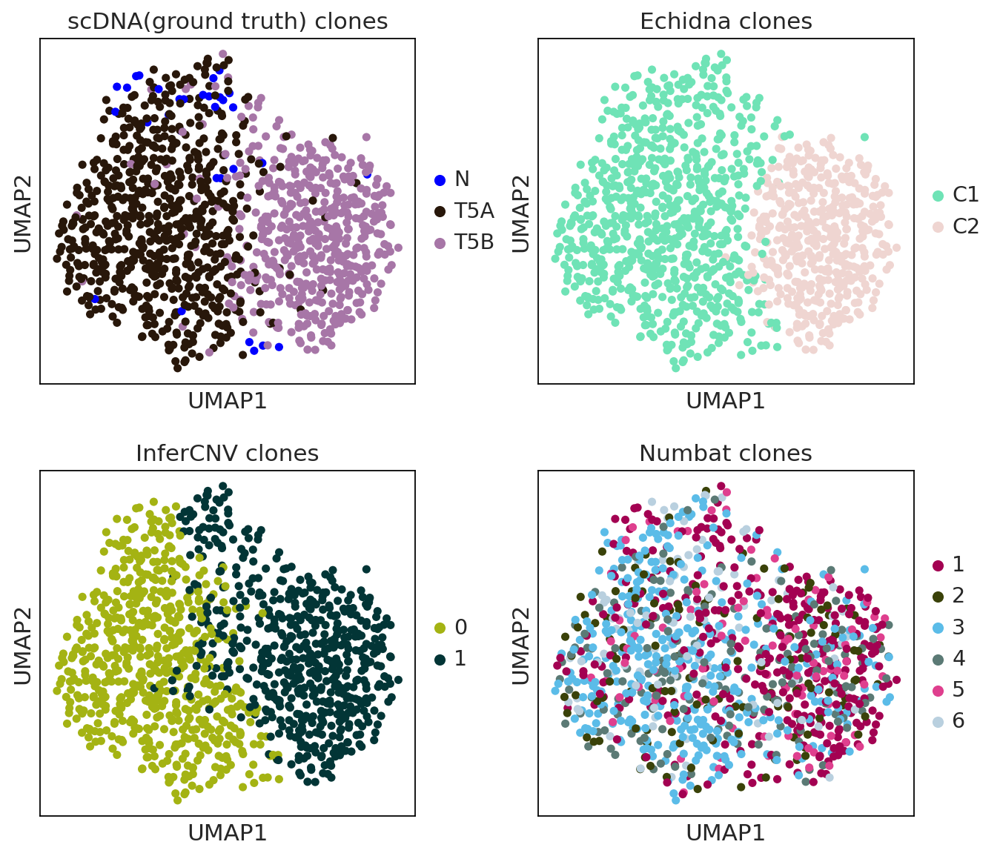

In [156]:
sc.pl.umap(tumor5, color=['ground_truth_clones', 'echidna_clones', 'inferCNV_clones', 'numbat_clones'], ncols=2,
           title=['scDNA(ground truth) clones', 'Echidna clones', 'InferCNV clones', 'Numbat clones'])
#plt.savefig("fig1Sb_compare_clone_calling.svg", format='svg')

# Figure S2c

In [157]:
metrics_adata1 = evaluate_clustering_metrics(tumor5, 'ground_truth_clones', ['echidna_clones', 'inferCNV_clones', 'numbat_clones'])
metrics_adata1

,Purity,NMI,AMI,ARI
echidna_clones,"(0.8957250628667225, 0.009082253190666585)","(0.5759049414919155, 0.02465686528633041)","(0.5657595003129052, 0.02505697830742644)","(0.6588316471511441, 0.025043060845598316)"
inferCNV_clones,"(0.8498994132439228, 0.01318184172169412)","(0.4196307943635146, 0.024540550176021674)","(0.4203065301308407, 0.026555540728721422)","(0.5210494179605676, 0.027607021432744915)"
numbat_clones,"(0.670201173512154, 0.012619292963139893)","(0.08144778936619071, 0.009330839299194213)","(0.07578289579245676, 0.008710363667386619)","(0.06683129829689989, 0.010488663960052061)"


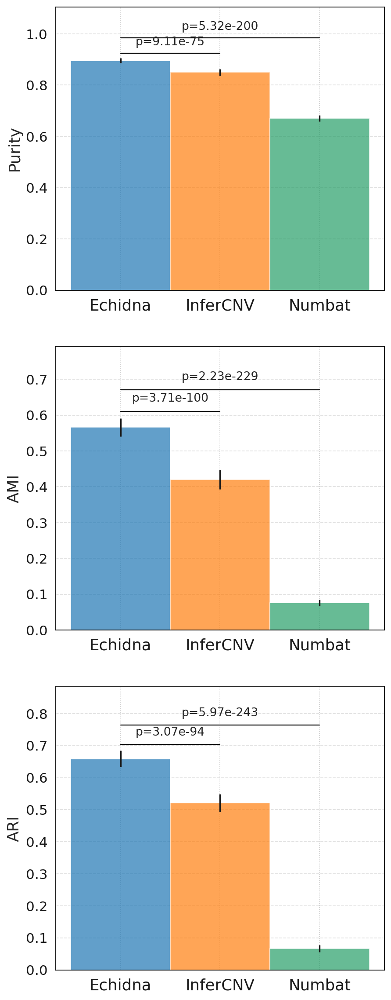

In [159]:
fig, axes = plt.subplots(3,1, figsize=(6, 18))
plot_metric_bar(axes[0], 'Purity', metrics_adata1, [''], orientation='vert')
plot_metric_bar(axes[1], 'AMI', metrics_adata1, [''], orientation='vert')
plot_metric_bar(axes[2], 'ARI', metrics_adata1, [''], orientation='vert')
#plt.savefig("figS1c_clone_call_metrics.svg", format='svg')

# Figure S2a

In [274]:
numbat_binned_tumor2 = np.load("/content/drive/MyDrive/Azizi lab/echidna/echidna-fig/intermediate_outputs/tumor2/numbat_binned.npy")
infercnv_binned_tumor2 = np.load("/content/drive/MyDrive/Azizi lab/echidna/echidna-fig/intermediate_outputs/tumor2/infercnv_binned.npy")

In [276]:
corr_infercnv = np.corrcoef(infercnv_binned_tumor2)
corr_infercnv.shape

(10, 10)

In [278]:
corr_numbat = np.corrcoef(numbat_binned_tumor2)
corr_numbat.shape

(10, 10)

In [279]:
infercnv_frob = np.linalg.norm(corr_dna - corr_infercnv, ord="fro")
infercnv_frob

0.9700094086455185

In [280]:
numbat_frob = np.linalg.norm(corr_dna - corr_numbat, ord="fro")
numbat_frob

2.008420827326801

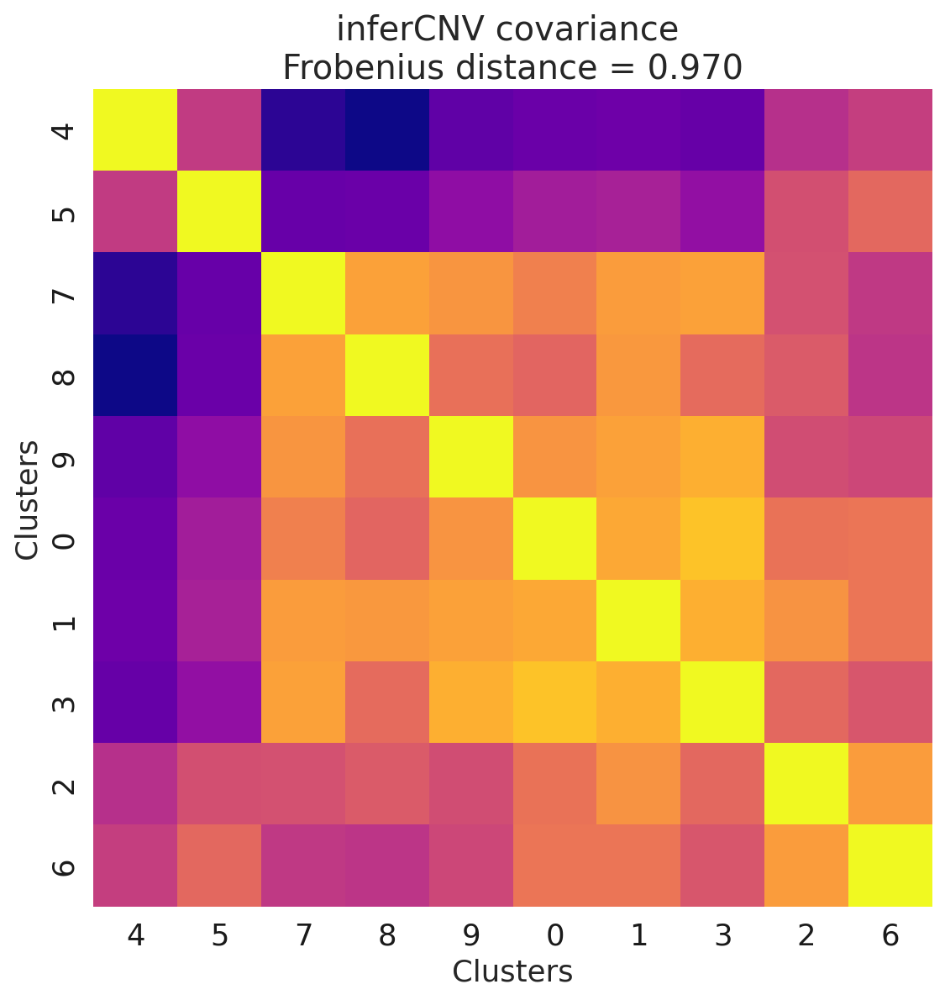

In [283]:
linkage_matrix = linkage(corr_dna, method='ward')
ordered_indices = leaves_list(linkage_matrix)

# Reorder the covariance matrices
cov_matrix2_ordered = corr_infercnv[np.ix_(ordered_indices, ordered_indices)]

# Create a figure with gridspec
fig = plt.figure(figsize=(8, 8))
gs = fig.add_gridspec(1, 1, width_ratios=[20], wspace=0.1)

# Heatmap 1
ax_heatmap1 = fig.add_subplot(gs[0])
sns.heatmap(
    cov_matrix2_ordered,
    ax=ax_heatmap1,
    cmap='plasma',
    cbar=False,
    xticklabels=ordered_indices,
    yticklabels=ordered_indices
)
ax_heatmap1.set_title("inferCNV covariance \nFrobenius distance = 0.970", fontsize=18)
ax_heatmap1.set_xlabel("Clusters", fontsize=16)
ax_heatmap1.set_ylabel("Clusters", fontsize=16)
ax_heatmap1.set_xticklabels(ax_heatmap1.get_xticklabels(), fontsize=16)
ax_heatmap1.set_yticklabels(ax_heatmap1.get_yticklabels(), fontsize=16)
plt.show()


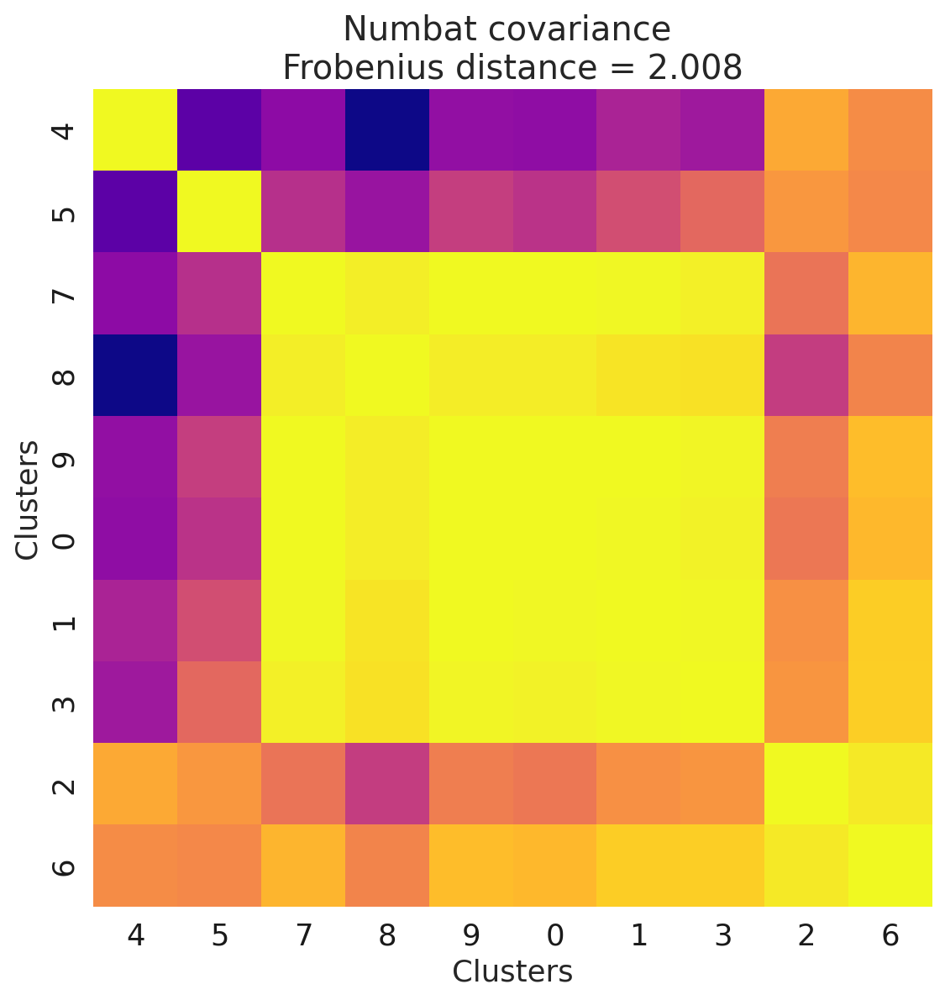

In [284]:
linkage_matrix = linkage(corr_dna, method='ward')
ordered_indices = leaves_list(linkage_matrix)

# Reorder the covariance matrices
cov_matrix2_ordered = corr_numbat[np.ix_(ordered_indices, ordered_indices)]

# Create a figure with gridspec
fig = plt.figure(figsize=(8, 8))
gs = fig.add_gridspec(1, 1, width_ratios=[20], wspace=0.1)

# Heatmap 1
ax_heatmap1 = fig.add_subplot(gs[0])
sns.heatmap(
    cov_matrix2_ordered,
    ax=ax_heatmap1,
    cmap='plasma',
    cbar=False,
    xticklabels=ordered_indices,
    yticklabels=ordered_indices
)
ax_heatmap1.set_title("Numbat covariance \nFrobenius distance = 2.008", fontsize=18)
ax_heatmap1.set_xlabel("Clusters", fontsize=16)
ax_heatmap1.set_ylabel("Clusters", fontsize=16)
ax_heatmap1.set_xticklabels(ax_heatmap1.get_xticklabels(), fontsize=16)
ax_heatmap1.set_yticklabels(ax_heatmap1.get_yticklabels(), fontsize=16)
plt.show()

# Figure S3a

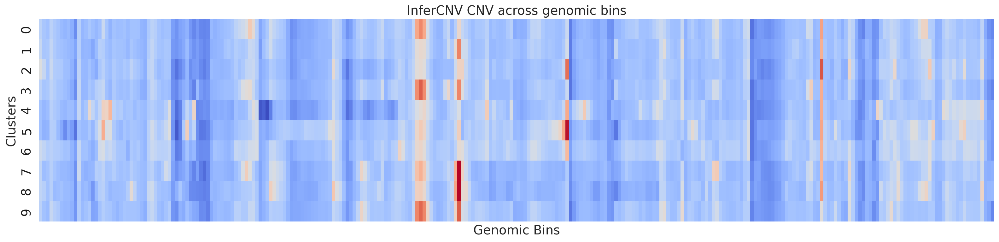

In [286]:
fig, ax = plt.subplots(figsize=(20,5), nrows=1, ncols=1)
sns.heatmap(infercnv_binned_tumor2, cmap="coolwarm", ax=ax, xticklabels=False, cbar=False)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
ax.set_xlabel("Genomic Bins", fontsize=18)
ax.set_ylabel("Clusters", fontsize=18)
ax.set_title("InferCNV CNV across genomic bins", fontsize=18)
plt.tight_layout()

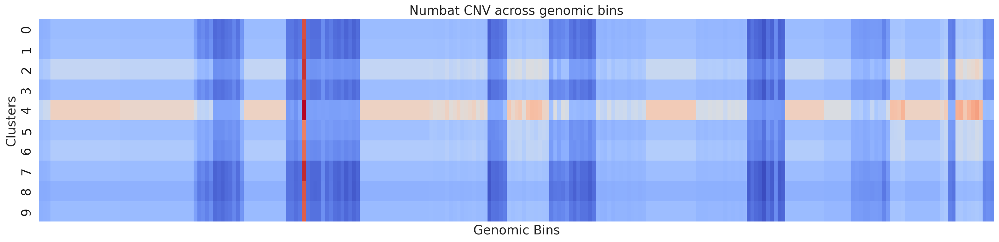

In [287]:
fig, ax = plt.subplots(figsize=(20,5), nrows=1, ncols=1)
sns.heatmap(numbat_binned_tumor2, cmap="coolwarm", ax=ax, xticklabels=False, cbar=False)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
ax.set_xlabel("Genomic Bins", fontsize=18)
ax.set_ylabel("Clusters", fontsize=18)
ax.set_title("Numbat CNV across genomic bins", fontsize=18)
plt.tight_layout()

# Figure S3b

In [164]:
import scipy
from scipy.stats import gaussian_kde

In [161]:
slope, intercept, r_value_eta, p_value, std_err = scipy.stats.linregress(np.array(eta_binned).flatten(), np.array(DNA_cluster).flatten())
slope, intercept, r_value_infercnv, p_value, std_err = scipy.stats.linregress(np.array(infercnv_binned).flatten(), np.array(DNA_cluster_infercnv).flatten())
slope, intercept, r_value_numbat, p_value, std_err = scipy.stats.linregress(np.array(numbat_binned).flatten(), np.array(DNA_cluster_numbat).flatten())

In [162]:
print(r_value_eta, r_value_infercnv, r_value_numbat)

0.6419675845930592 0.5462359803453569 0.5731936938633494


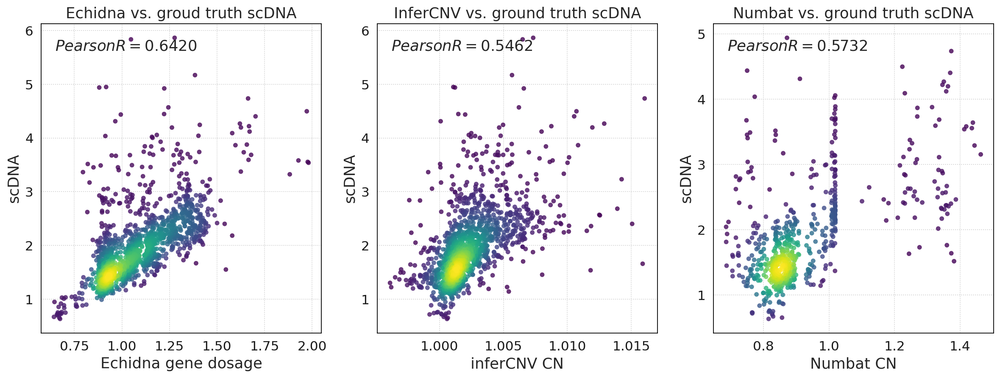

In [165]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
colors = ['blue', 'green', 'red']
plot_scatter_with_density(axes[0], np.array(eta_binned).flatten(), np.array(DNA_cluster).flatten(),
                          "Echidna vs. groud truth scDNA",
                          "Echidna gene dosage", 'scDNA', 20)
plot_scatter_with_density(axes[1], np.array(infercnv_binned).flatten(), np.array(DNA_cluster_infercnv).flatten(),
                          "InferCNV vs. ground truth scDNA", "inferCNV CN", "scDNA", 20)
plot_scatter_with_density(axes[2], np.array(numbat_binned).flatten(), np.array(DNA_cluster_numbat).flatten(),
                          "Numbat vs. ground truth scDNA", "Numbat CN", "scDNA", 20)
#plt.savefig("figS2b_compare_cn_estimates_tumor_5.svg", format='svg')

# Figure S3c

In [166]:
clusters = list(range(5))

In [175]:
dna_states, X = predict_states_with_binned_cnv(DNA_cluster, clusters, plot_gmm=False, n_comp=2, n_comp_hmm=5)

In [176]:
eta = ec.tl.load_model(tumor5).eta_posterior
eta_np = eta.cpu().detach().numpy()
eta_df_filtered = pd.DataFrame(eta_np, columns=tumor5.var_names)
eta_binned, discard_bins = binning_eta(eta_df_filtered)

In [201]:
dna_states_eta, X_eta = predict_states_with_binned_cnv(eta_binned, clusters, plot_gmm=False, n_comp=2, n_iter=500)

## Numbat bin-level CNV prediction tumor 5

In [179]:
numbat_snp_cnv = numbat_bulk[['CHROM', 'POS', 'sample', 'cnv_state_post']]
numbat_snp_cnv['CHROM'] = numbat_snp_cnv['CHROM'].astype(str)
numbat_snp_cnv

,CHROM,POS,sample,cnv_state_post
0,1,14362,1,loh
1,1,134773,1,loh
2,1,661139,1,loh
3,1,700245,1,loh
4,1,761586,1,loh
...,...,...,...,...
153712,21,47815251,6,del
153713,21,47821588,6,del
153714,21,47862624,6,del
153715,21,47878862,6,del


In [180]:
bins = map[['chr', 'start', 'stop']]
bins['chr'] = bins['chr'].str.replace('chr', '')
bins

,chr,start,stop
0,1,0,14162233
1,1,14162233,27382184
2,1,27382184,38550236
3,1,38550236,55768724
4,1,55768724,67940820
...,...,...,...
295,X,119113350,126114914
296,X,126114914,134090813
297,X,134090813,141191109
298,X,141191109,146142467


In [181]:
bins['bin_id'] = bins.apply(lambda x: f"{x['chr']}:{x['start']}-{x['stop']}", axis=1)
bins

,chr,start,stop,bin_id
0,1,0,14162233,1:0-14162233
1,1,14162233,27382184,1:14162233-27382184
2,1,27382184,38550236,1:27382184-38550236
3,1,38550236,55768724,1:38550236-55768724
4,1,55768724,67940820,1:55768724-67940820
...,...,...,...,...
295,X,119113350,126114914,X:119113350-126114914
296,X,126114914,134090813,X:126114914-134090813
297,X,134090813,141191109,X:134090813-141191109
298,X,141191109,146142467,X:141191109-146142467


In [182]:
merged = pd.merge(numbat_snp_cnv, bins, left_on='CHROM', right_on='chr', how='inner')
merged

,CHROM,POS,sample,cnv_state_post,chr,start,stop,bin_id
0,1,14362,1,loh,1,0,14162233,1:0-14162233
1,1,14362,1,loh,1,14162233,27382184,1:14162233-27382184
2,1,14362,1,loh,1,27382184,38550236,1:27382184-38550236
3,1,14362,1,loh,1,38550236,55768724,1:38550236-55768724
4,1,14362,1,loh,1,55768724,67940820,1:55768724-67940820
...,...,...,...,...,...,...,...,...
751440,21,48055507,6,del,21,0,16718687,21:0-16718687
751441,21,48055507,6,del,21,16718687,23042865,21:16718687-23042865
751442,21,48055507,6,del,21,23042865,28403521,21:23042865-28403521
751443,21,48055507,6,del,21,28403521,35651042,21:28403521-35651042


In [183]:
merged = merged[(merged['POS'] >= merged['start']) & (merged['POS'] <= merged['stop'])]
merged

,CHROM,POS,sample,cnv_state_post,chr,start,stop,bin_id
0,1,14362,1,loh,1,0,14162233,1:0-14162233
21,1,134773,1,loh,1,0,14162233,1:0-14162233
42,1,661139,1,loh,1,0,14162233,1:0-14162233
63,1,700245,1,loh,1,0,14162233,1:0-14162233
84,1,761586,1,loh,1,0,14162233,1:0-14162233
...,...,...,...,...,...,...,...,...
751424,21,47815251,6,del,21,35651042,48129895,21:35651042-48129895
751429,21,47821588,6,del,21,35651042,48129895,21:35651042-48129895
751434,21,47862624,6,del,21,35651042,48129895,21:35651042-48129895
751439,21,47878862,6,del,21,35651042,48129895,21:35651042-48129895


In [184]:
def mode_func(x):
    return x.value_counts().idxmax()

grouped = merged.groupby(['sample', 'bin_id'], as_index=False)['cnv_state_post'].apply(mode_func)
clone_by_bin_cnv_states = grouped.pivot(index='sample', columns='bin_id', values='cnv_state_post')
clone_by_bin_cnv_states

bin_id,10:109080866-115498362,10:115498362-125734756,10:125734756-135534747,10:42387024-48125910,10:48125910-59728209,10:59728209-67648363,10:67648363-83248665,10:83248665-92863310,10:92863310-109080866,11:0-12598724,...,8:11111970-21179724,8:21179724-30844221,8:30844221-38738729,8:38738729-49877818,8:49877818-58155894,9:0-10658382,9:10658382-18324230,9:18324230-25531316,9:25531316-32373343,9:32373343-42504875
sample,,,,,,,,,,,,,,,,,,,,,
1,loh,loh,loh,del,loh,loh,loh,loh,loh,loh,...,loh,loh,loh,loh,loh,loh,loh,loh,loh,loh
2,del,del,del,del,del,del,del,del,del,loh,...,del,del,del,del,del,loh,loh,loh,loh,loh
3,del,del,del,del,del,del,del,del,del,del,...,del,del,del,del,del,loh,loh,loh,loh,loh
4,del,del,del,NaN,del,del,del,del,del,del,...,del,del,del,del,del,loh,loh,loh,loh,loh
5,del,del,del,NaN,del,del,del,del,del,loh,...,loh,loh,loh,loh,loh,loh,loh,loh,loh,loh
6,del,del,del,NaN,del,del,del,del,del,NaN,...,del,del,del,del,del,NaN,NaN,NaN,NaN,NaN


In [185]:
clone_by_bin_cnv_states.fillna('neut', inplace=True)
clone_by_bin_cnv_states

bin_id,10:109080866-115498362,10:115498362-125734756,10:125734756-135534747,10:42387024-48125910,10:48125910-59728209,10:59728209-67648363,10:67648363-83248665,10:83248665-92863310,10:92863310-109080866,11:0-12598724,...,8:11111970-21179724,8:21179724-30844221,8:30844221-38738729,8:38738729-49877818,8:49877818-58155894,9:0-10658382,9:10658382-18324230,9:18324230-25531316,9:25531316-32373343,9:32373343-42504875
sample,,,,,,,,,,,,,,,,,,,,,
1,loh,loh,loh,del,loh,loh,loh,loh,loh,loh,...,loh,loh,loh,loh,loh,loh,loh,loh,loh,loh
2,del,del,del,del,del,del,del,del,del,loh,...,del,del,del,del,del,loh,loh,loh,loh,loh
3,del,del,del,del,del,del,del,del,del,del,...,del,del,del,del,del,loh,loh,loh,loh,loh
4,del,del,del,neut,del,del,del,del,del,del,...,del,del,del,del,del,loh,loh,loh,loh,loh
5,del,del,del,neut,del,del,del,del,del,loh,...,loh,loh,loh,loh,loh,loh,loh,loh,loh,loh
6,del,del,del,neut,del,del,del,del,del,neut,...,del,del,del,del,del,neut,neut,neut,neut,neut


In [186]:
clone_by_bin_cnv_states = clone_by_bin_cnv_states.replace('loh', 'del', regex=True)
clone_by_bin_cnv_states

bin_id,10:109080866-115498362,10:115498362-125734756,10:125734756-135534747,10:42387024-48125910,10:48125910-59728209,10:59728209-67648363,10:67648363-83248665,10:83248665-92863310,10:92863310-109080866,11:0-12598724,...,8:11111970-21179724,8:21179724-30844221,8:30844221-38738729,8:38738729-49877818,8:49877818-58155894,9:0-10658382,9:10658382-18324230,9:18324230-25531316,9:25531316-32373343,9:32373343-42504875
sample,,,,,,,,,,,,,,,,,,,,,
1,del,del,del,del,del,del,del,del,del,del,...,del,del,del,del,del,del,del,del,del,del
2,del,del,del,del,del,del,del,del,del,del,...,del,del,del,del,del,del,del,del,del,del
3,del,del,del,del,del,del,del,del,del,del,...,del,del,del,del,del,del,del,del,del,del
4,del,del,del,neut,del,del,del,del,del,del,...,del,del,del,del,del,del,del,del,del,del
5,del,del,del,neut,del,del,del,del,del,del,...,del,del,del,del,del,del,del,del,del,del
6,del,del,del,neut,del,del,del,del,del,neut,...,del,del,del,del,del,neut,neut,neut,neut,neut


In [187]:
valid_bin_id_numbat = [bins.loc[i]['bin_id'] for i in valid_bins_numbat]
clone_by_bin_cnv_states = clone_by_bin_cnv_states[valid_bin_id_numbat]
clone_by_bin_cnv_states

bin_id,1:0-14162233,1:14162233-27382184,1:27382184-38550236,1:38550236-55768724,1:55768724-67940820,1:67940820-79160729,1:79160729-86982135,1:86982135-96283209,1:96283209-104492031,1:104492031-111805851,...,17:27636142-42706903,19:0-19847566,19:19847566-31272670,19:31272670-43283816,19:43283816-59128983,21:0-16718687,21:16718687-23042865,21:23042865-28403521,21:28403521-35651042,21:35651042-48129895
sample,,,,,,,,,,,,,,,,,,,,,
1,del,del,del,del,neut,neut,neut,neut,neut,neut,...,del,del,del,del,del,del,del,del,del,del
2,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
3,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
4,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
5,neut,neut,neut,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
6,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del


In [188]:
nb_clones['cluster'] = tumor5.obs['leiden']
nb_clones_grouped = nb_clones.groupby('cluster')['clone_opt'].apply(lambda x: x.value_counts().idxmax())
nb_clones_grouped

,clone_opt
cluster,
0,1
1,3
2,3
3,3
4,1


In [189]:
cluster_by_bin_cnv_states = clone_by_bin_cnv_states.reindex(index=nb_clones_grouped.values)
cluster_by_bin_cnv_states.index = nb_clones_grouped.index
cluster_by_bin_cnv_states

bin_id,1:0-14162233,1:14162233-27382184,1:27382184-38550236,1:38550236-55768724,1:55768724-67940820,1:67940820-79160729,1:79160729-86982135,1:86982135-96283209,1:96283209-104492031,1:104492031-111805851,...,17:27636142-42706903,19:0-19847566,19:19847566-31272670,19:31272670-43283816,19:43283816-59128983,21:0-16718687,21:16718687-23042865,21:23042865-28403521,21:28403521-35651042,21:35651042-48129895
cluster,,,,,,,,,,,,,,,,,,,,,
0,del,del,del,del,neut,neut,neut,neut,neut,neut,...,del,del,del,del,del,del,del,del,del,del
1,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
2,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
3,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
4,del,del,del,del,neut,neut,neut,neut,neut,neut,...,del,del,del,del,del,del,del,del,del,del


In [190]:
pred_states_numbat = cluster_by_bin_cnv_states
pred_states_numbat

bin_id,1:0-14162233,1:14162233-27382184,1:27382184-38550236,1:38550236-55768724,1:55768724-67940820,1:67940820-79160729,1:79160729-86982135,1:86982135-96283209,1:96283209-104492031,1:104492031-111805851,...,17:27636142-42706903,19:0-19847566,19:19847566-31272670,19:31272670-43283816,19:43283816-59128983,21:0-16718687,21:16718687-23042865,21:23042865-28403521,21:28403521-35651042,21:35651042-48129895
cluster,,,,,,,,,,,,,,,,,,,,,
0,del,del,del,del,neut,neut,neut,neut,neut,neut,...,del,del,del,del,del,del,del,del,del,del
1,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
2,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
3,del,del,del,amp,amp,amp,amp,amp,amp,amp,...,del,del,del,del,del,del,del,del,del,del
4,del,del,del,del,neut,neut,neut,neut,neut,neut,...,del,del,del,del,del,del,del,del,del,del


## InferCNV bin-level CNV prediction tumor 5

In [191]:
def assign_cnv_states_infercnv(data, threshold=1.96):
    # Compute mean and std for each row
    row_means = data.mean(axis=1)
    row_stds = data.std(axis=1)
    result = np.empty_like(data, dtype=object)
    # Precompute threshold bounds for each element
    lower_thresh = row_means - threshold * row_stds
    upper_thresh = row_means + threshold * row_stds

    # Assign states
    # Criteria:
    # amp: value > mean + threshold * std
    # del: value < mean - threshold * std
    # neut: otherwise
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            val = data[i, j]
            if val > upper_thresh[i]:
                result[i, j] = "amp"
            elif val < lower_thresh[i]:
                result[i, j] = "del"
            else:
                # Default case is "neut"
                result[i, j] = "neut"

    return pd.DataFrame(result)

In [192]:
pred_states_infercnv = assign_cnv_states_infercnv(infercnv_binned, threshold=1.0)
pred_states_infercnv

,0,1,2,3,4,5,6,7,8,9,...,270,271,272,273,274,275,276,277,278,279
0,neut,neut,neut,neut,amp,amp,amp,amp,amp,amp,...,neut,neut,neut,neut,neut,del,amp,neut,neut,neut
1,neut,neut,neut,neut,neut,amp,amp,amp,amp,neut,...,neut,neut,neut,neut,del,del,amp,neut,neut,neut
2,neut,del,neut,neut,neut,amp,amp,amp,amp,neut,...,neut,neut,neut,neut,del,del,amp,neut,neut,neut
3,neut,del,neut,neut,neut,amp,amp,amp,neut,neut,...,neut,neut,neut,neut,del,del,amp,neut,neut,neut
4,neut,neut,neut,neut,neut,amp,amp,amp,amp,neut,...,neut,neut,neut,neut,neut,del,amp,neut,neut,neut


In [202]:
prec_ech, recall_ech, tpr_ech, fpr_ech = compute_precision_recall_tpr_fpr(dna_states_eta.values, dna_states.values)
print(prec_ech)
print(recall_ech)

[0.53846154 0.75862069 0.92941176 0.72222222 0.64473684]
[0.0625     0.16541353 0.47305389 0.0942029  0.85964912]


In [195]:
dna_states_dna_numbat = dna_states.values[:, valid_bins_numbat]
prec_numbat, recall_numbat, tpr_numbat, fpr_numbat = compute_precision_recall_tpr_fpr(pred_states_numbat.values, dna_states_dna_numbat)
print(prec_numbat)
print(recall_numbat)

[0.         0.35294118 0.41935484 0.41666667 0.        ]
[0.         0.05042017 0.1092437  0.04201681 0.        ]


In [196]:
dna_states_dna_infercnv = dna_states.values[:, valid_bins_infercnv]
prec_infercnv, recall_infercnv, tpr_infercnv, fpr_infercnv = compute_precision_recall_tpr_fpr(pred_states_infercnv.values, dna_states_dna_infercnv)
print(prec_infercnv)
print(recall_infercnv)

[0.38461538 0.37931034 0.34117647 0.44444444 0.39473684]
[0.09433962 0.16923077 0.43283582 0.13114754 0.42253521]


In [197]:
f1_ech= 2 * (prec_ech * recall_ech) / (prec_ech + recall_ech)
f1_infercnv= 2 * (prec_infercnv * recall_infercnv) / (prec_infercnv + recall_infercnv)
f1_numbat= 2 * (prec_numbat[1:] * recall_numbat[1:]) / (prec_numbat[1:] + recall_numbat[1:])

In [203]:
np.mean(f1_ech), np.mean(f1_infercnv), np.mean(f1_numbat)

(0.3592415979056394, 0.27556631259016096, nan)

Text(0, 0.5, 'Recall')

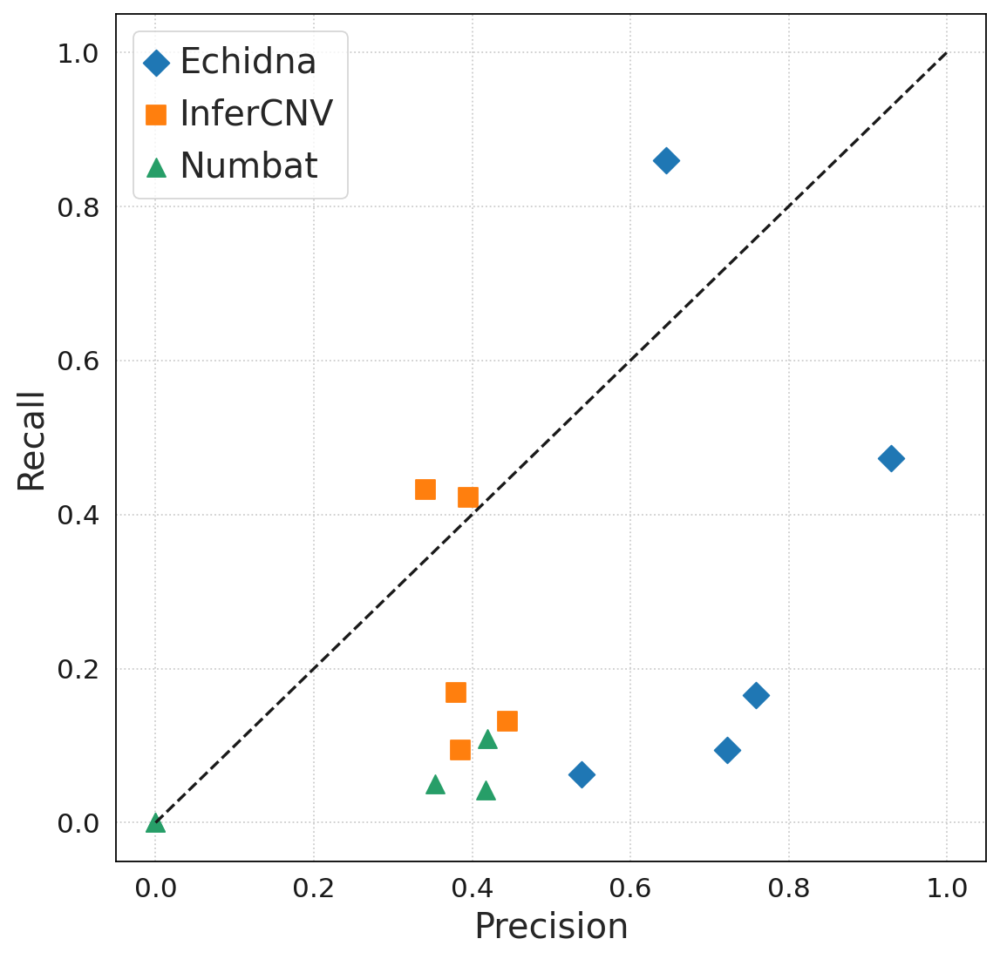

In [205]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(prec_ech, recall_ech, label='Echidna', marker='D', s=90)
ax.scatter(prec_infercnv, recall_infercnv, label='InferCNV', marker='s', s=90)
ax.scatter(prec_numbat, recall_numbat, label='Numbat', marker='^', s=90)
ax.plot([0,1],[0,1],'k--')
ax.legend(prop={'size': 18})
ax.set_xlabel('Precision', fontsize=18)
ax.set_ylabel('Recall', fontsize=18)
#plt.savefig("figS2_c_precision_recall.svg", format='svg')

Text(0, 0.5, 'True Positive rate')

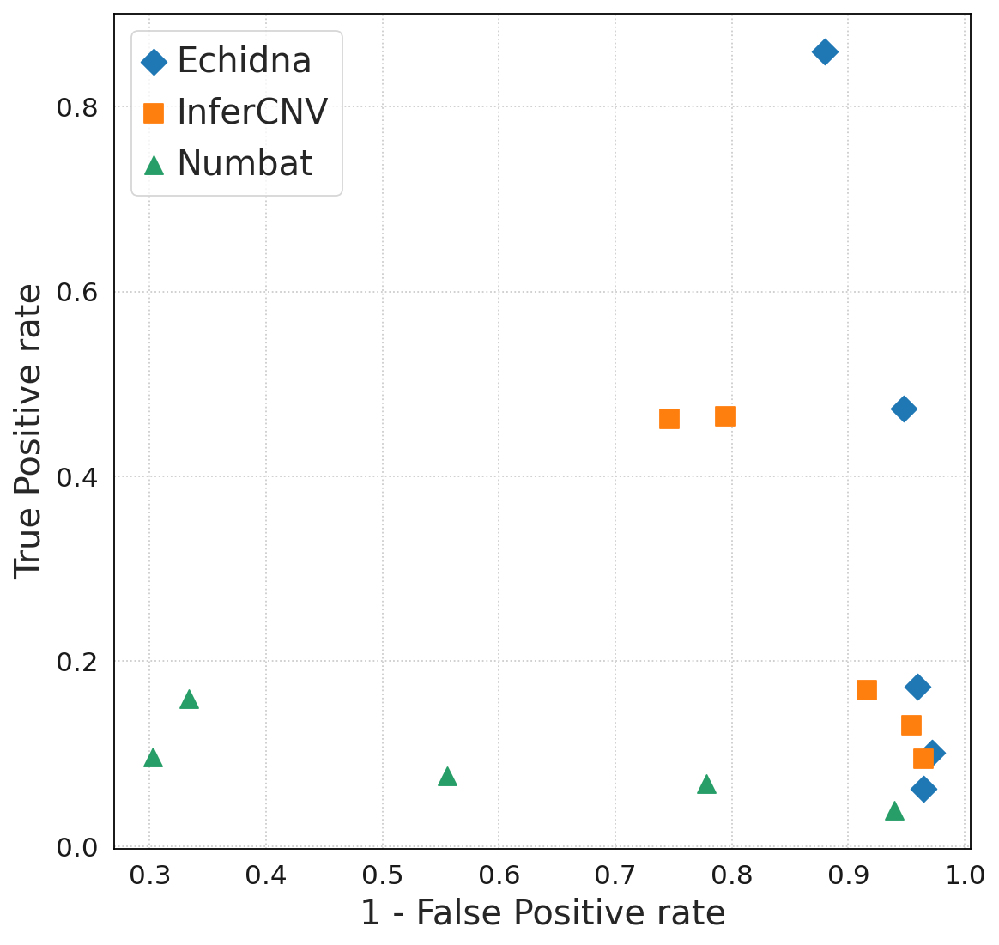

In [206]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(1-fpr_ech, tpr_ech, label='Echidna', marker='D', s=90)
ax.scatter(1-fpr_infercnv, tpr_infercnv, label='InferCNV', marker='s', s=90)
ax.scatter(1-fpr_numbat, tpr_numbat, label='Numbat', marker='^', s=90)
#ax.plot([0,1],[0,1],'k--')
ax.legend(prop={'size': 18})
ax.set_xlabel('1 - False Positive rate', fontsize=18)
ax.set_ylabel('True Positive rate', fontsize=18)
#plt.savefig("figS2_c_tpr_fpr.svg", format='svg')

# Fit on melanoma

In [207]:
ground_truth_clone_colors = [
    "#300b0f", "#28170a", "#a776a7", "#f0c688", "#87836c", "#c9c53f"
]
ground_truth_clone_colors_t5 = [
    "blue", "#28170a", "#a776a7", "#f0c688", "#87836c", "#c9c53f"
]
echidna_clone_colors = [
    "#6fe3b6", "#efd5d1", "#181a75", "#d47372", "#acc2b8", "#a04cd0"
]
inferCNV_clone_colors = [
    "#a4b313", "#023536", "#515251", "#6c9576"
]
numbat_clone_colors = [
    "#a30152", "#3a4209", "#5bbce8", "#5b7a75", "#df3f8e", "#b9d0df", "black"
]
expression_clone_colors = [
    "#1d3e4d", "#c3636b", "#ec7c19", "#9281d7", "#423c40", "#524057"
]
condition_colors = ["#f3de2c", "#f2542d"]

In [230]:
adata = sc.read_h5ad("/content/drive/MyDrive/Azizi lab/echidna/results/params_mt_refined/samples/R310/X.h5")
wdf = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/results/all_cellranger_w.csv").set_index("gene")

In [231]:
adata.uns["ground_truth_clones_colors"] = ground_truth_clone_colors
adata.uns["echidna_clones_colors"] = echidna_clone_colors
adata.uns["inferCNV_clones_colors"] = inferCNV_clone_colors
adata.uns["numbat_clones_colors"] = numbat_clone_colors
adata.uns["condition_colors"] = condition_colors

In [232]:
wdf = wdf.drop(index='HES4') # drop bad gene
wdf

,Unnamed: 0,F01_pre_count,F01_on_count,F02_pre_count,F02_on_count,F03_post1_pre2_count,F03_post1_on2_count,F04_pre_count,F05_pre_count,F06_post1_pre2_count,...,F31_post_count,R294_on_count,R310_pre_count,R310_on2_count,R319_pre_count,R319_on_count,R328_on_count,R329_on_count,R334_pre_count,R354_pre_count
gene,,,,,,,,,,,,,,,,,,,,,
ISG15,1,1.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,3.0,4.0,3.0,2.0
AL645608.1,2,1.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,3.0,4.0,3.0,2.0
AGRN,3,1.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,3.0,4.0,3.0,2.0
AL645608.5,4,1.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,3.0,4.0,3.0,2.0
AL645608.8,5,1.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,3.0,4.0,3.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SMC5,34580,NaN,NaN,NaN,NaN,2.0,3.0,1.0,NaN,2.0,...,1.0,2.0,1.0,1.0,2.0,2.0,1.0,NaN,3.0,NaN
AL162390.1,34581,NaN,NaN,NaN,NaN,2.0,3.0,1.0,NaN,2.0,...,1.0,2.0,1.0,1.0,2.0,2.0,1.0,NaN,3.0,NaN
KLF9,34582,NaN,NaN,NaN,NaN,2.0,3.0,1.0,NaN,2.0,...,1.0,2.0,1.0,1.0,2.0,2.0,1.0,NaN,3.0,NaN


In [233]:
wdf = wdf[['R310_pre_count', 'R310_on2_count']]
wdf

,R310_pre_count,R310_on2_count
gene,,
ISG15,2.0,2.0
AL645608.1,2.0,2.0
AGRN,2.0,2.0
AL645608.5,2.0,2.0
AL645608.8,2.0,2.0
...,...,...
SMC5,1.0,1.0
AL162390.1,1.0,1.0
KLF9,1.0,1.0


In [234]:
ec.tl.set_sort_order(
    adata,
    ["pre", "on", "on1", "on2", "post", "post1", "post1_pre2", "post1_on2", "post2"]
)

In [235]:
sc.set_figure_params(scanpy=True, fontsize=14)

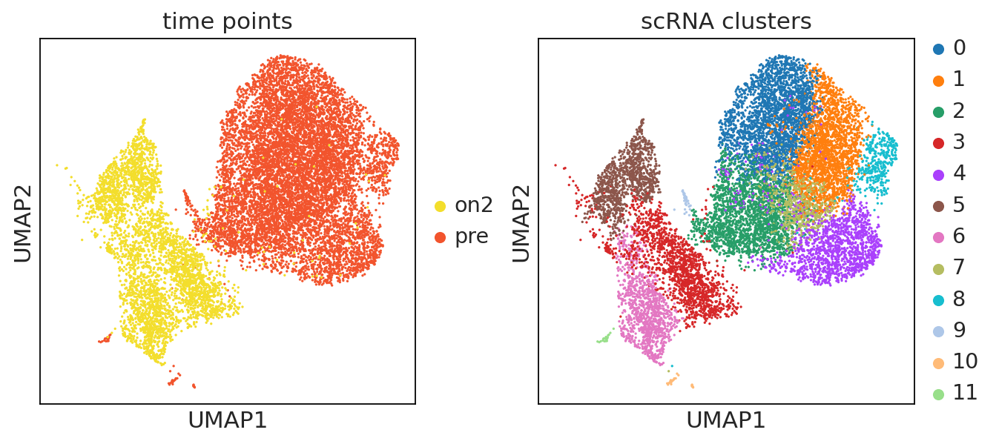

In [236]:
sc.pl.umap(adata, color=['condition', 'leiden'], title=['time points', 'scRNA clusters'])
#plt.savefig("fig_4_a_umap.svg", format='svg')

In [237]:
num_timepoints = 2
num_clusters = len(adata.obs["leiden"].unique())
q_corr_init = 1e-2
q_shape_rate_scaler = 10.0
eta_mean_init = 2.0
lkj_concentration = 1.0

training loss: 0.7867 | validation loss: 0.1328: 100%|██████████| 500/500 [01:21<00:00,  6.13it/s]


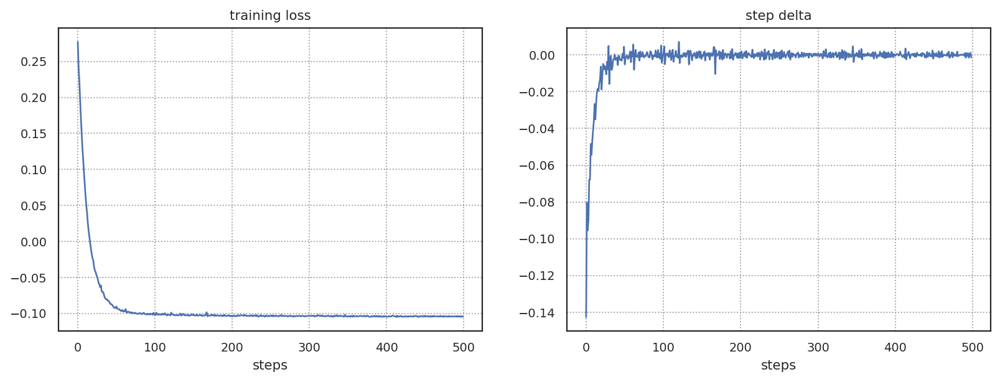

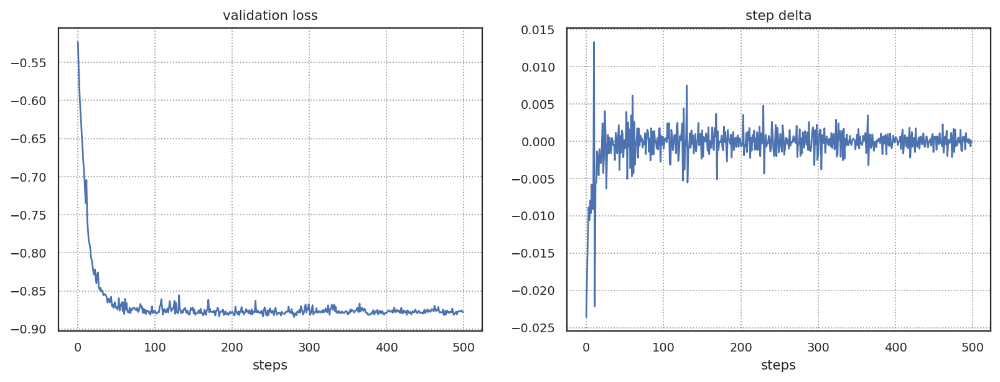

In [238]:
config = ec.tl.EchidnaConfig(
    timepoint_label = "condition",
    counts_layer = "counts",
    clusters = "leiden",
    inverse_gamma = False,
    eta_mean_init = eta_mean_init,
    patience = -1,
    learning_rate = .1,
    num_timepoints = num_timepoints,
    num_clusters = num_clusters,
    q_corr_init = q_corr_init,
    q_shape_rate_scaler = q_shape_rate_scaler,
    n_steps=500,
)
ec.tl.echidna_train(
     adata
    , wdf
    , config
)

# Figure S5a, b

training loss: 0.9415 | validation loss: 0.1484: 100%|██████████| 500/500 [01:16<00:00,  6.55it/s]


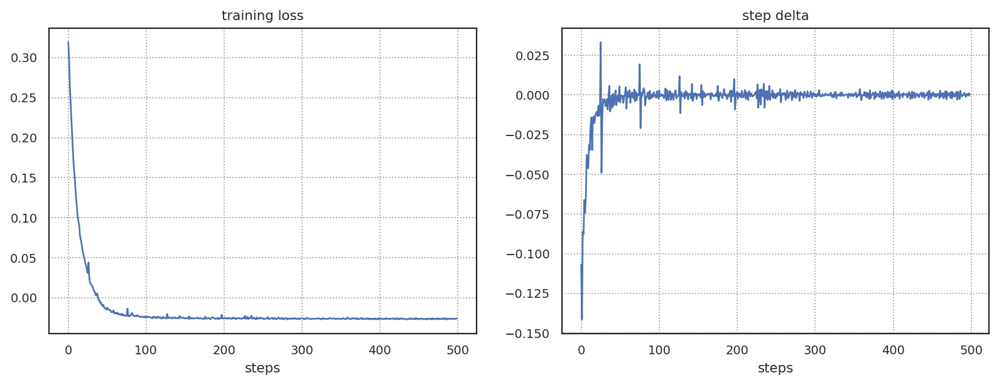

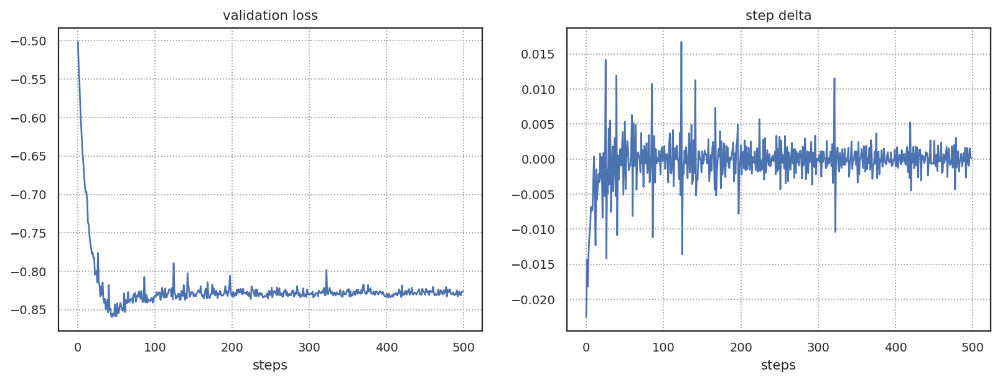

In [243]:
ec.tl.simulate(adata)

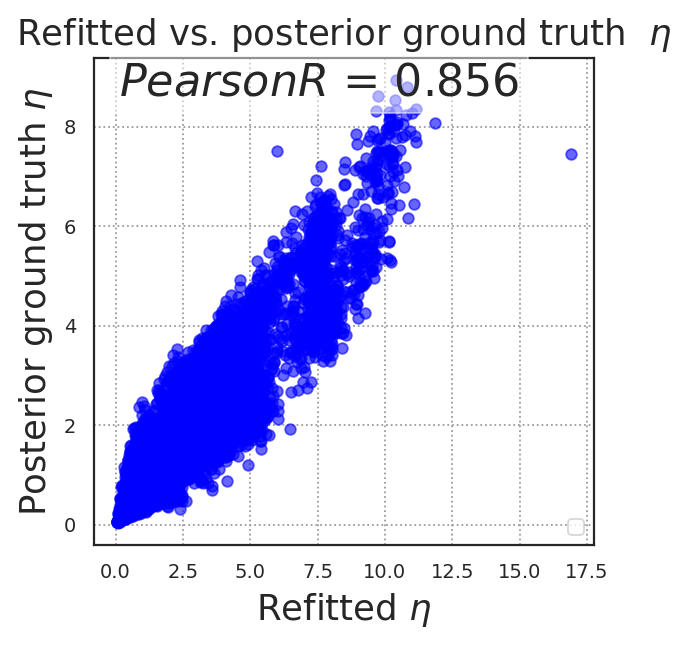

In [244]:
ec.pl.ppc(adata, "eta")

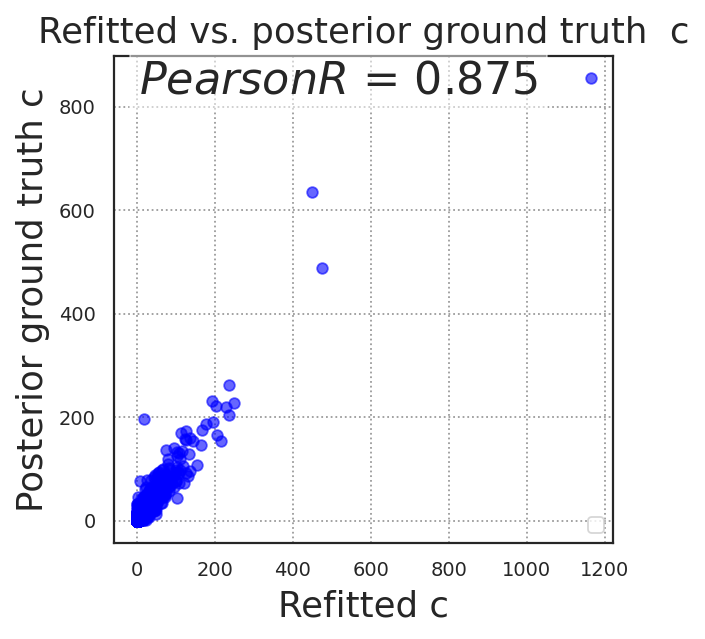

In [245]:
ec.pl.ppc(adata, "c")

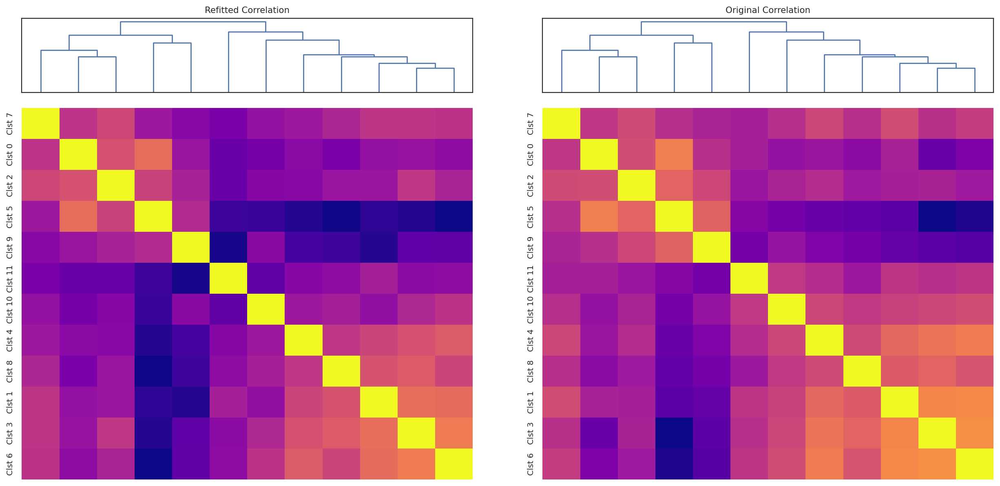

In [246]:
ec.pl.ppc(adata, "cov", corr=True, cmap='plasma')

# Figure S5c, d

In [247]:
adata.obs['leiden'] = adata.obs['leiden'].astype(str)

In [248]:
label_to_remove = '9'
adata_no_9 = adata[adata.obs['leiden'] != label_to_remove].copy()
new_labels, _ = pd.factorize(adata_no_9.obs['leiden'].astype(int).values)
adata_no_9.obs['leiden_new'] = new_labels.astype(str)

In [249]:
adata_no_9.uns["ground_truth_clones_colors"] = ground_truth_clone_colors
adata_no_9.uns["echidna_clones_colors"] = echidna_clone_colors
adata_no_9.uns["inferCNV_clones_colors"] = inferCNV_clone_colors
adata_no_9.uns["numbat_clones_colors"] = numbat_clone_colors
adata_no_9.uns["condition_colors"] = condition_colors

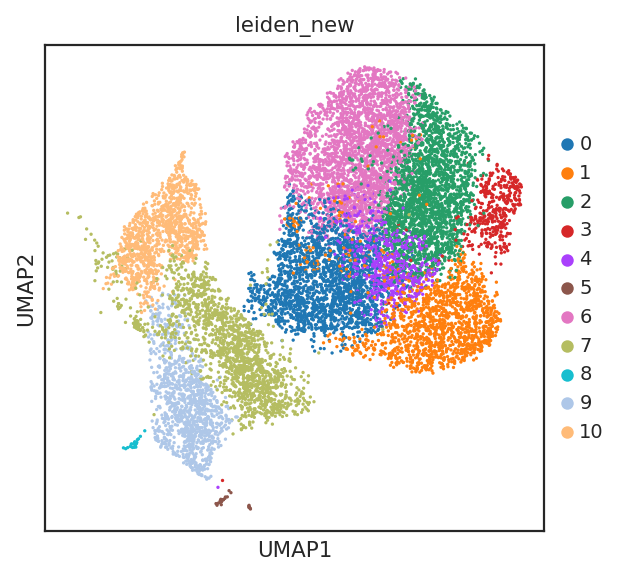

In [250]:
sc.pl.umap(adata_no_9, color=['leiden_new'])

In [251]:
num_timepoints = 2
num_clusters = len(adata_no_9.obs["leiden"].unique())
#num_clusters = len(adata.obs["leiden"].unique())
q_corr_init = 1e-2
q_shape_rate_scaler = 10.0
eta_mean_init = 2.0
lkj_concentration = 1.0

training loss: 0.7847 | validation loss: 0.1354: 100%|██████████| 500/500 [01:22<00:00,  6.08it/s]


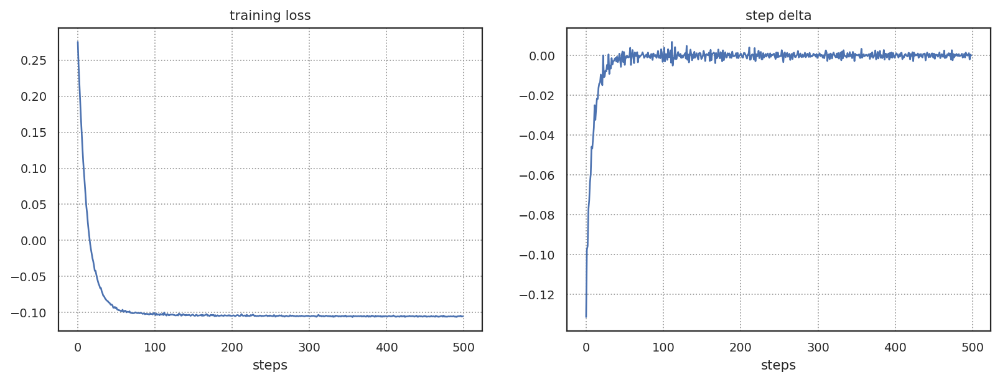

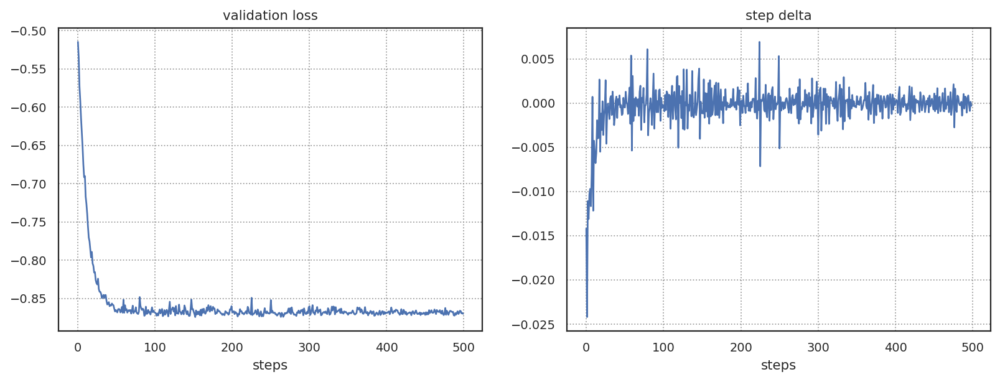

In [252]:
config = ec.tl.EchidnaConfig(
    timepoint_label = "condition",
    counts_layer = "counts",
    clusters = "leiden_new",
    inverse_gamma = False,
    eta_mean_init = 2.,
    patience = -1,
    learning_rate = .1,
    num_timepoints = num_timepoints,
    num_clusters = num_clusters,
    q_corr_init = q_corr_init,
    q_shape_rate_scaler = q_shape_rate_scaler,
    n_steps=500,
)
ec.tl.echidna_train(
     adata_no_9
    , wdf
    , config
)

In [253]:
ec.tl.echidna_clones(adata_no_9, method='manual', threshold=0.07)

In [254]:
adata_no_9.obs['leiden_new'] = adata_no_9.obs['leiden_new'].astype(str)

In [255]:
echidna_clone_colors_no_9 = [
    "#d47372", "#6fe3b6", "#efd5d1", "#181a75", "#acc2b8", "#a04cd0"
]

In [256]:
adata_no_9.uns["echidna_clones_colors"] = echidna_clone_colors_no_9

<Axes: title={'center': 'Echidna clones after dropping smallest cluster'}, xlabel='UMAP1', ylabel='UMAP2'>

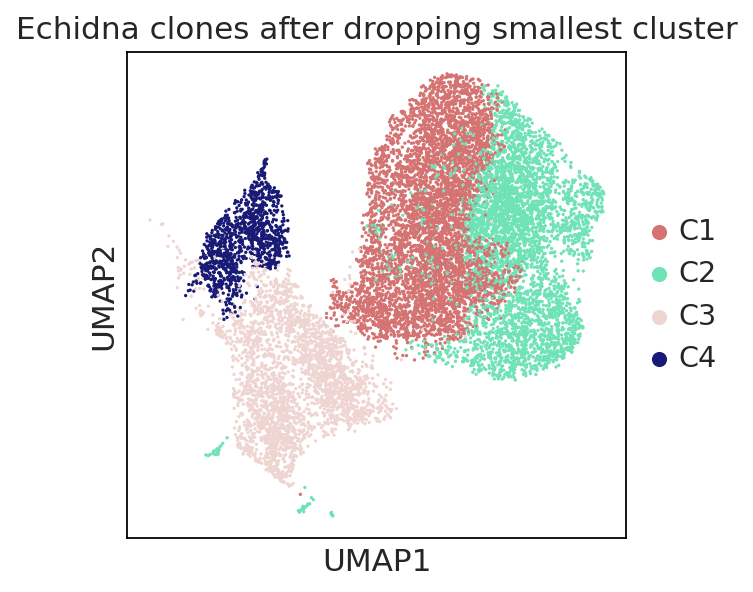

In [257]:
sc.set_figure_params(scanpy=True, fontsize=14)
sc.pl.umap(adata_no_9, color=['echidna_clones'], show=False, title=['Echidna clones after dropping smallest cluster'])
#plt.savefig("figS4_d_echidna_clones_after_remove.svg", format='svg')

In [258]:
old_c = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/results/params_mt_refined/samples/R310/c_on.csv").set_index("genes")

In [259]:
model = ec.tl.load_model(adata_no_9)

In [260]:
new_c = model.c_posterior

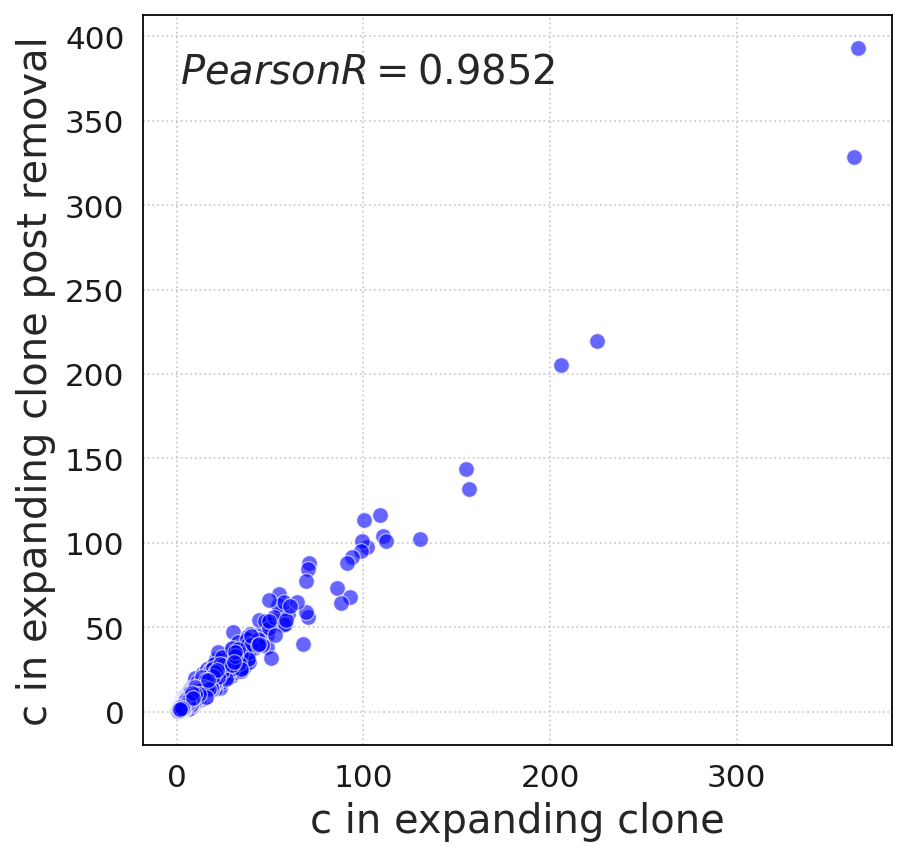

In [261]:
plt.figure(figsize=(6, 6))
c_before = np.array(old_c['5'])
c_after = new_c[1, 10, :].detach().cpu().numpy()


slope, intercept, r_value, p_value, std_err = linregress(c_before, c_after)
r_squared = r_value
data = pd.DataFrame({'c_b': c_before, 'c_a': c_after})
scatter = sns.scatterplot(data=data, x='c_b', y='c_a', s=50, color='blue', alpha=0.6, rasterized=True)
plt.xlabel("c in expanding clone", fontsize=18)
plt.ylabel("c in expanding clone post removal", fontsize=18)
plt.text(0.05, 0.95, f'$Pearson R = {r_squared:.4f}$', transform=plt.gca().transAxes,
             fontsize=18, verticalalignment='top')
plt.savefig("figS4_c_before_after_c.svg", format='svg')

In [262]:
old_eta = pd.read_csv("/content/drive/MyDrive/Azizi lab/echidna/results/params_mt_refined/samples/R310/eta.csv").set_index("genes")

In [263]:
new_eta = model.eta_posterior
new_eta.shape

torch.Size([11, 23648])

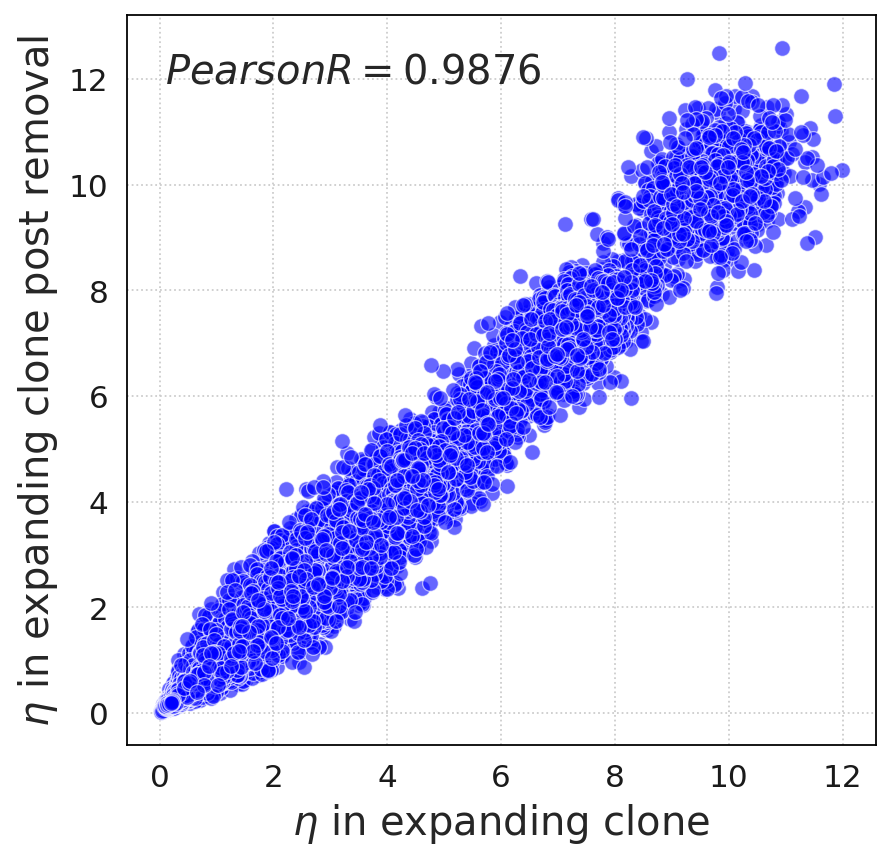

In [264]:
plt.figure(figsize=(6, 6))
c_before = np.array(old_eta['5'])
c_after = new_eta[10, :].detach().cpu().numpy()
slope, intercept, r_value, p_value, std_err = linregress(c_before, c_after)
r_squared = r_value
data = pd.DataFrame({'c_b': c_before, 'c_a': c_after})
scatter = sns.scatterplot(data=data, x='c_b', y='c_a', s=50, color='blue', alpha=0.6, rasterized=True)
plt.xlabel("$\eta$ in expanding clone", fontsize=18)
plt.ylabel("$\eta$ in expanding clone post removal", fontsize=18)
plt.text(0.05, 0.95, f'$Pearson R = {r_squared:.4f}$', transform=plt.gca().transAxes,
             fontsize=18, verticalalignment='top')
plt.savefig("figS4_eta_before_after_eta.svg", format='svg')